# Trabajo de título
## Estudio de la complementariedad actual en centrales solar fotovoltaica y eólica en Chile

#### Estudiante: Matías Osses
#### Profesor guía: Rodrigo Palma

## Importando librerías

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import glob

## Data 

Los datos extraídos de la página del Coordinador Eléctrico corresponden a la generación real durante el periodo comprendido entre enero y diciembre de 2020 

In [237]:
def cargar_dataset():
    files = ['2020-1.tsv', '2020-2.tsv', '2020-3.tsv', '2020-4.tsv','2020-5.tsv','2020-6.tsv',
             '2020-7.tsv','2020-8.tsv','2020-9.tsv','2020-10.tsv','2020-11.tsv','2020-12.tsv']

    link = 'https://raw.githubusercontent.com/MatiasOssest/memoria/master/'
    df = pd.DataFrame()
    for f in files:
        file = link + f
        aux = pd.read_csv(f, sep='\t')
        df = pd.concat([df,aux])
    df =df.reset_index()
    
    df = df.drop(df[df.fecha_opreal == "2020-02-29"].index) # eliminamos día bisiesto
    df = df.drop(df[df['hora_opreal'] > 24].index) # borrando datos mal inyectados operando en horas imposibles
    df['hora_opreal'] = df['hora_opreal'] - 1

    df['time'] = df['fecha_opreal'] + ' ' + df['hora_opreal'].astype('str')+':00:00'
    df['time'] = df['time'].str.replace('-','/')
    df['time'] = pd.to_datetime(df['time'])
    
    return df

df = cargar_dataset()  
df = df.drop('central_tipo_nemotecnico', axis=1)
df

,index,fecha_opreal,hora_opreal,central_infotecnica_id,central_nombre,central_tipo,generacion_real_mwh,generacion_real_ernc_mwh,time
0,0,2020-01-01,0,163,HP LIRCAY,Hidráulica,17.400000,17.400000,2020-01-01 00:00:00
1,1,2020-01-01,0,443,PMGD PFV EL LAUREL,Solar,0.000000,0.000000,2020-01-01 00:00:00
2,2,2020-01-01,0,262,PMGD HP EL LLANO,Hidráulica,0.887921,0.887921,2020-01-01 00:00:00
3,3,2020-01-01,0,264,HE ANGOSTURA,Hidráulica,47.000000,0.000000,2020-01-01 00:00:00
4,4,2020-01-01,0,591,PMGD TER ALMENDRADO,Térmica,0.000000,0.000000,2020-01-01 00:00:00
...,...,...,...,...,...,...,...,...,...
5112758,469650,2020-12-31,20,1801,PMGD PFV PLAYERITO,Solar,0.135022,0.135022,2020-12-31 20:00:00
5112759,469651,2020-12-31,20,1802,PMGD PFV GR RAULI,Solar,0.079324,0.079324,2020-12-31 20:00:00
5112760,469652,2020-12-31,20,1803,PMGD PFV SANTA INES SOLAR,Solar,0.080385,0.080385,2020-12-31 20:00:00
5112761,469653,2020-12-31,20,1816,PMGD PFV EL SALITRAL,Solar,0.102898,0.102898,2020-12-31 20:00:00


## Manejo y limpieza de datos

In [238]:
gt = df #.pivot_table(values='generacion_real_mwh', columns='central_nombre',index='time')
# El dataset extraído corresponde a todas las centrales del país, por lo que extraemos sólo las de interés.

solar = df[df['central_tipo']=='Solar'] #Datos de las centrales solares.
eolica = df[df['central_tipo']=='Eólica'] # Datos de las centrales eólicas.

df = pd.concat([solar,eolica])
df = df.sort_values(['time'], ascending=True)
df = df.reset_index()

eol = eolica.pivot_table(values='generacion_real_ernc_mwh', columns='central_nombre', index='time')
sol = solar.pivot_table(values='generacion_real_ernc_mwh', columns='central_nombre', index='time')

df

,level_0,index,fecha_opreal,hora_opreal,central_infotecnica_id,central_nombre,central_tipo,generacion_real_mwh,generacion_real_ernc_mwh,time
0,1,1,2020-01-01,0,443,PMGD PFV EL LAUREL,Solar,0.0,0.0,2020-01-01 00:00:00
1,398,398,2020-01-01,0,439,PMGD PFV EL SAUCE,Solar,0.0,0.0,2020-01-01 00:00:00
2,401,401,2020-01-01,0,606,PMGD PFV PEDREROS SOLAR,Solar,0.0,0.0,2020-01-01 00:00:00
3,402,402,2020-01-01,0,367,PMGD PFV BELLAVISTA,Solar,0.0,0.0,2020-01-01 00:00:00
4,410,410,2020-01-01,0,399,PFV FINIS TERRAE,Solar,0.0,0.0,2020-01-01 00:00:00
...,...,...,...,...,...,...,...,...,...,...
2165774,5103317,460209,2020-12-31,23,1711,PMGD PFV CHACABUCO,Solar,0.0,0.0,2020-12-31 23:00:00
2165775,5103319,460211,2020-12-31,23,1713,PMGD PFV VILLA CRUZ,Solar,0.0,0.0,2020-12-31 23:00:00
2165776,5103321,460213,2020-12-31,23,1718,PMGD PFV PULLALLI SOLAR,Solar,0.0,0.0,2020-12-31 23:00:00
2165777,5103205,460097,2020-12-31,23,617,PMGD PFV CASUTO,Solar,0.0,0.0,2020-12-31 23:00:00


In [239]:
a = eol['2020-01-01 00:00:00':'2020-01-31 23:00:00'].isna().sum(axis=0)
b=a[a < 15].index
link='https://raw.githubusercontent.com/MatiasOssest/memoria/master/potencia_instalada.csv'
ct = pd.read_csv('potencia_instalada.csv')
ct = ct.rename(columns={'Nombre Central':'central', 'Potencia Máxima Bruta': 'potencia'})
ct.index = ct.central
ct['potencia'] = pd.to_numeric(ct['potencia'],errors='coerce')
ct = ct['potencia']
ct['PE EL ARRAYÁN'] = ct['PE EL ARRAYAN']
ct['PE RENAICO'] = ct['PE RENAICO I']
ct.head()

central
PE CANELA II         1.5
PE MONTE REDONDO     2.0
PE TOTORAL           2.0
PE LEBU              0.6
PE PUNTA COLORADA    2.0
Name: potencia, dtype: float64

## Factor de planta generación ERNC

In [240]:
def quitar_plantas_de_prueba(df,umbral=0.2):
    start_dates=['2020-01-01 00:00:00', '2020-02-01 00:00:00', '2020-03-01 00:00:00', '2020-04-01 00:00:00',
                 '2020-05-01 00:00:00', '2020-06-01 00:00:00', '2020-07-01 00:00:00', '2020-08-01 00:00:00',
                 '2020-09-01 00:00:00', '2020-10-01 00:00:00', '2020-11-01 00:00:00', '2020-12-01 00:00:00']
    end_dates=['2020-01-31 23:00:00', '2020-02-28 23:00:00', '2020-03-31 23:00:00', '2020-04-30 23:00:00',
               '2020-05-31 23:00:00', '2020-06-30 23:00:00', '2020-07-31 23:00:00', '2020-08-31 23:00:00',
               '2020-09-30 23:00:00', '2020-10-31 23:00:00', '2020-11-30 23:00:00', '2020-12-31 23:00:00']
    df2 = pd.DataFrame()
    for start,end in zip(start_dates, end_dates):
      temp = df.loc[start:end]
      n = round(len(temp)*umbral) #cantidad de NaN para eliminar centrales de prueba
      temp = temp.loc[:, (temp.isna().sum(axis=0) <= n)]
      temp = temp.sum(axis=1)
      df2 = pd.concat([df2,temp])
  
    return df2


def quitar_plantas2(df,umbral=0.2):
    start_dates=['2020-01-01 00:00:00', '2020-02-01 00:00:00', '2020-03-01 00:00:00', '2020-04-01 00:00:00',
                 '2020-05-01 00:00:00', '2020-06-01 00:00:00', '2020-07-01 00:00:00', '2020-08-01 00:00:00',
                 '2020-09-01 00:00:00', '2020-10-01 00:00:00', '2020-11-01 00:00:00', '2020-12-01 00:00:00']
    end_dates=['2020-01-31 23:00:00', '2020-02-28 23:00:00', '2020-03-31 23:00:00', '2020-04-30 23:00:00',
               '2020-05-31 23:00:00', '2020-06-30 23:00:00', '2020-07-31 23:00:00', '2020-08-31 23:00:00',
               '2020-09-30 23:00:00', '2020-10-31 23:00:00', '2020-11-30 23:00:00', '2020-12-31 23:00:00']
    meses=['enero', 'febrero', 'marzo', 'abril', 'mayo', 'junio', 'julio', 'agosto', 'septiembre', 'octubre', 'noviembre', 'diciembre']
    d = dict()
    for start,end,month in zip(start_dates,end_dates,meses):
      centrales_mes = df[start:end]
      n  = round(len(centrales_mes)*umbral)
      centrales_mes = centrales_mes.isna().sum(axis=0)
      c=centrales_mes[centrales_mes < n].index
      d[month] = c
    
    return d    
def p_inst_mensual(df, centrales):
    d = dict()
    for key in centrales.keys():
      d[key] = df[df.isin(centrales[key])].sum()

    return d

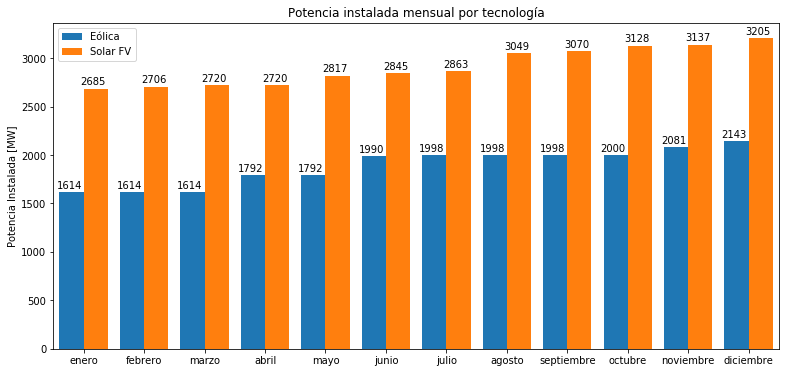

In [270]:
#e = quitar_plantas_de_prueba(eol)
#s = quitar_plantas_de_prueba(sol)

p_inst_eolica = dict(enero=1614, febrero=1614, marzo=1614, abril=1792, mayo=1792,
           junio=1990, julio=1998, agosto=1998, septiembre=1998, octubre=2000,
           noviembre=2081, diciembre=2143) # Potencia instalada según reporte mensual ERNC Energía abierta

p_inst_solar = dict(enero=2685, febrero=2706, marzo=2720, abril=2720, mayo=2817,
           junio=2845, julio=2863, agosto=3049, septiembre=3070, octubre=3128,
           noviembre=3137, diciembre=3205) # Potencia instalada según reporte mensual ERNC Energía abierta

plt.figure(figsize=(13,6))
plt.bar(x_axis-0.2, p_inst_eolica.values(), 0.4, label='Eólica')
plt.bar(x_axis+0.2, p_inst_solar.values(), 0.4, label='Solar FV')
for x,fp_e,fp_s in zip(x_axis,p_inst_eolica.values(),p_inst_solar.values()):
    plt.text(x=x-0.45,y=fp_e+40, s='%.0f'%(fp_e))
    plt.text(x=x-0.05,y=fp_s+40, s='%.0f'%(fp_s))
plt.xticks(x_axis, meses)
plt.ylabel('Potencia Instalada [MW]')
plt.xlim(-0.5,11.5)
#plt.yticks(np.arange(0,0.51,0.05))
plt.legend(loc='upper left')
plt.title('Potencia instalada mensual por tecnología')
#plt.savefig('factor_de_planta.png')
plt.show()

factor de planta recurso eólico 0.33432317786357335
factor de planta recurso solar 0.29831556429736544


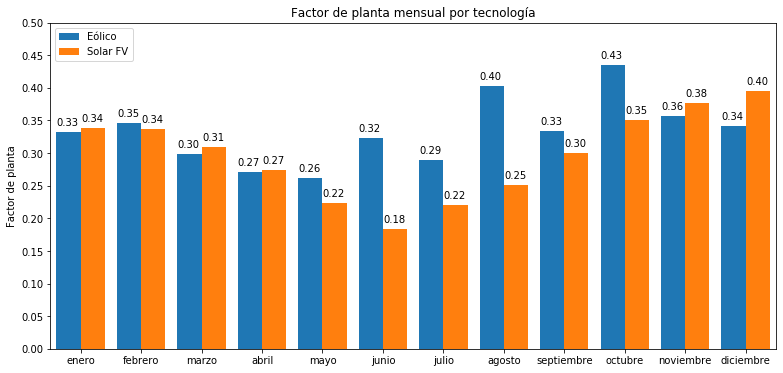

In [271]:
def calcular_fp(df, potencia_instalada_mensual):
  temp = df.sum(axis=1)
  d = dict() #diccionario que contendrá la energía real mensual generada
  d['enero'] = temp[temp.index < '2020-02-01 00:00:00'].sum() #Energía generada en enero
  d['febrero'] = temp[temp.index < '2020-03-01 00:00:00'].sum() - temp[temp.index < '2020-02-01 00:00:00'].sum() #Energía generada en febrero
  d['marzo'] = temp[temp.index < '2020-04-01 00:00:00'].sum() - temp[temp.index < '2020-03-01 00:00:00'].sum() #Energía generada en marzo
  d['abril'] = temp[temp.index < '2020-05-01 00:00:00'].sum() - temp[temp.index < '2020-04-01 00:00:00'].sum() #Energía generada en abril
  d['mayo'] = temp[temp.index < '2020-06-01 00:00:00'].sum() - temp[temp.index < '2020-05-01 00:00:00'].sum()  #Energía generada en mayo
  d['junio'] = temp[temp.index < '2020-07-01 00:00:00'].sum() - temp[temp.index < '2020-06-01 00:00:00'].sum()  #Energía generada en junio
  d['julio'] = temp[temp.index < '2020-08-01 00:00:00'].sum() - temp[temp.index < '2020-07-01 00:00:00'].sum() #Energía generada en julio
  d['agosto'] = temp[temp.index < '2020-09-01 00:00:00'].sum() - temp[temp.index < '2020-08-01 00:00:00'].sum()  #Energía generada en agosto
  d['septiembre'] = temp[temp.index < '2020-10-01 00:00:00'].sum() - temp[temp.index < '2020-09-01 00:00:00'].sum() #Energía generada en septiembre
  d['octubre'] = temp[temp.index < '2020-11-01 00:00:00'].sum() - temp[temp.index < '2020-10-01 00:00:00'].sum() #Energía generada en octubre
  d['noviembre'] = temp[temp.index < '2020-12-01 00:00:00'].sum() - temp[temp.index < '2020-11-01 00:00:00'].sum() #Energía generada en noviembre
  d['diciembre'] = temp[temp.index < '2021-01-01 00:00:00'].sum() - temp[temp.index < '2020-12-01 00:00:00'].sum()  #Energía generada en diciembre
  
  h = dict(enero= 744, febrero=672, marzo= 744, abril=720, mayo=744,
           junio= 720, julio=744, agosto=744, septiembre=720, octubre=744,
           noviembre=720, diciembre=744) # cantidad de horas cada mes
  fp = dict()
  for mes in h.keys():
    fp[mes] = d[mes]/(h[mes] * potencia_instalada_mensual[mes])
  
  return fp

def fp_anual(fp_mensual, p_instalada_mensual):
    
    total = np.array(list(p_instalada_mensual.values())).sum()
    fp = 0
    keys=p_instalada_mensual.keys()
    
    for key in keys:
      fp+= fp_mensual[key]*p_instalada_mensual[key]/total

    return fp

fp_eolico = calcular_fp(e, p_inst_eolica)
fp_solar = calcular_fp(s, p_inst_solar)
print('factor de planta recurso eólico', fp_anual(fp_eolico, p_inst_eolica))
print('factor de planta recurso solar', fp_anual(fp_solar, p_inst_solar))

meses = list(fp_eolico.keys())
fp_eolico = np.array(list(fp_eolico.values()))
fp_solar = np.array(list(fp_solar.values()))
x_axis = np.arange(12)


plt.figure(figsize=(13,6))
plt.bar(x_axis-0.2, fp_eolico, 0.4, label='Eólico')
plt.bar(x_axis+0.2, fp_solar, 0.4, label='Solar FV')
for x,fp_e,fp_s in zip(x_axis,fp_eolico,fp_solar):
    plt.text(x=x-0.4,y=fp_e+0.01, s='%.2f'%(fp_e))
    plt.text(x=x+0.005,y=fp_s+0.01, s='%.2f'%(fp_s))
plt.xticks(x_axis, meses)
plt.ylabel('Factor de planta')
plt.yticks(np.arange(0,0.51,0.05))
plt.legend(loc='upper left')
plt.title('Factor de planta mensual por tecnología')
plt.xlim(-0.5,11.5)
plt.savefig('factor_de_planta.png')
plt.show()


In [242]:
gt.head()

,index,fecha_opreal,hora_opreal,central_infotecnica_id,central_nombre,central_tipo,generacion_real_mwh,generacion_real_ernc_mwh,time
0,0,2020-01-01,0,163,HP LIRCAY,Hidráulica,17.400000,17.400000,2020-01-01
1,1,2020-01-01,0,443,PMGD PFV EL LAUREL,Solar,0.000000,0.000000,2020-01-01
2,2,2020-01-01,0,262,PMGD HP EL LLANO,Hidráulica,0.887921,0.887921,2020-01-01
3,3,2020-01-01,0,264,HE ANGOSTURA,Hidráulica,47.000000,0.000000,2020-01-01
4,4,2020-01-01,0,591,PMGD TER ALMENDRADO,Térmica,0.000000,0.000000,2020-01-01


In [243]:
df = df.pivot_table(values='generacion_real_mwh', columns='central_nombre', index='time')
df

central_nombre,PE AURORA,PE CABO LEONES,PE CABO LEONES II,PE CABO LEONES II [En_Revision],PE CABO LEONES III,PE CABO LEONES III [EN_REVISION],PE CABO LEONES III [En_Revision],PE CANELA,PE CANELA II,PE CUEL,...,PMGD PFV VALLE SOLAR OESTE II,PMGD PFV VICTORIA,PMGD PFV VILLA ALEGRE,PMGD PFV VILLA CRUZ,PMGD PFV VILLA PRAT,PMGD PFV VILLA SECA,PMGD PFV VITUCO 2B,PMGD PFV ÑILHUE,PMGD PFV ÑIQUEN,PMGD PFV ÑIQUÉN
time,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,113.3,4.7,NaN,NaN,NaN,NaN,NaN,0.00,0.30,18.01,...,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN
2020-01-01 01:00:00,103.7,0.8,NaN,NaN,NaN,NaN,NaN,0.00,0.00,19.30,...,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN
2020-01-01 02:00:00,68.8,0.0,NaN,NaN,NaN,NaN,NaN,0.00,0.00,15.74,...,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN
2020-01-01 03:00:00,99.6,0.0,NaN,NaN,NaN,NaN,NaN,0.00,0.00,12.82,...,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN
2020-01-01 04:00:00,75.1,0.0,NaN,NaN,NaN,NaN,NaN,0.00,0.00,11.48,...,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,40.5,44.2,39.5,NaN,NaN,36.2,NaN,6.56,35.98,16.57,...,3.349262,1.028217,2.474609,0.934496,0.861217,0.657447,1.420948,0.003913,0.703431,NaN
2020-12-31 20:00:00,44.1,28.3,21.8,NaN,NaN,28.7,NaN,6.20,40.05,23.51,...,0.126047,0.043003,0.375764,0.149049,0.097055,0.114263,0.143176,0.000000,0.128675,NaN
2020-12-31 21:00:00,33.0,15.5,12.3,NaN,NaN,19.1,NaN,4.62,27.10,22.91,...,0.000000,0.000000,0.000000,0.000108,0.000012,0.000098,0.000000,0.000000,0.002135,NaN


In [244]:
df = df.loc[:, (df.isna().sum(axis=0) <= 0)] # Se dejan solo las centrales que hayan operado durante todo el año
df.head()

central_nombre,PE AURORA,PE CABO LEONES,PE CANELA,PE CANELA II,PE CUEL,PE LA ESPERANZA,PE LA FLOR,PE LEBU,PE LOS BUENOS AIRES,PE LOS CURUROS,...,PMGD PFV TECHOS DE ALTAMIRA,PMGD PFV TILTIL,PMGD PFV TRICAHUE II,PMGD PFV VALLE DE LA LUNA II,PMGD PFV VALLE SOLAR ESTE II,PMGD PFV VALLE SOLAR OESTE II,PMGD PFV VILLA PRAT,PMGD PFV VILLA SECA,PMGD PFV VITUCO 2B,PMGD PFV ÑILHUE
time,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,113.3,4.7,0.0,0.3,18.01,8.25,26.0,2.5,13.87,0.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 01:00:00,103.7,0.8,0.0,0.0,19.30,8.74,26.0,1.8,17.78,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 02:00:00,68.8,0.0,0.0,0.0,15.74,6.40,20.0,1.4,12.12,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 03:00:00,99.6,0.0,0.0,0.0,12.82,6.46,22.0,0.5,10.92,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 04:00:00,75.1,0.0,0.0,0.0,11.48,6.34,20.0,0.6,10.06,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Se tienen 26 centrales eólicas, 31 centrales fotovoltaicas y 120 PMGD fotovoltaicas

A continuación se calcula su potencia máxima, sin embargo pocas de estas centrales su máximo corresponde a su potencia nominal, la información de la potencia nominal es buscar central por central cual es este valor para normalizar los datos.

## Matriz de correlación

In [245]:
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_correlations(df, corrm, n=5):
    au_corr = corrm.unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

def get_top_complementarity(df, corrm, n=5):
    au_corr = corrm.unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=True)
    return au_corr[0:n]

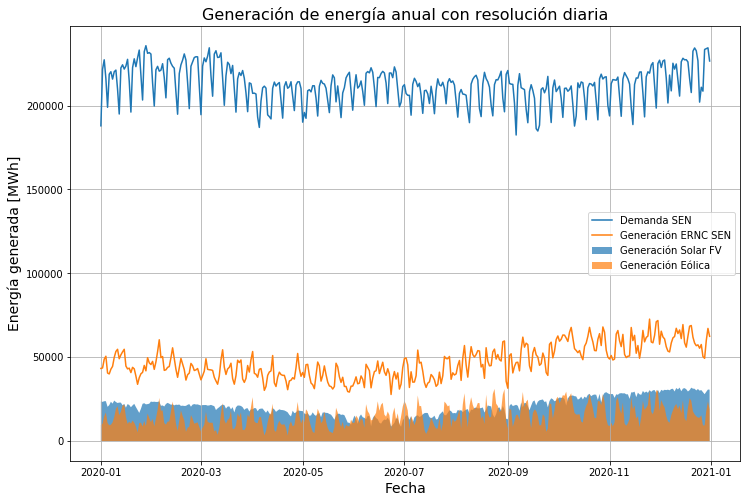

Index([2020-01-01, 2020-01-02, 2020-01-03, 2020-01-04, 2020-01-05, 2020-01-06,
       2020-01-07, 2020-01-08, 2020-01-09, 2020-01-10,
       ...
       2020-12-22, 2020-12-23, 2020-12-24, 2020-12-25, 2020-12-26, 2020-12-27,
       2020-12-28, 2020-12-29, 2020-12-30, 2020-12-31],
      dtype='object', name='time', length=365)

In [249]:
st=solar.groupby([solar['time'].dt.date]).sum()
eol=eolica.groupby([eolica['time'].dt.date]).sum()
g=gt.groupby([gt['time'].dt.date]).sum()

plt.figure(figsize=(12,8))
plt.fill_between(st.index,st['generacion_real_mwh'], alpha=0.7)
plt.fill_between(eol.index,eol['generacion_real_mwh'], alpha=0.7)
plt.plot(g.index,g['generacion_real_mwh'])
plt.plot(g.index,g['generacion_real_ernc_mwh'])
plt.legend(['Demanda SEN','Generación ERNC SEN','Generación Solar FV','Generación Eólica'],loc=5)
plt.grid()
plt.xlabel('Fecha', fontsize='14')
plt.ylabel('Energía generada [MWh]',fontsize=14)
plt.title('Generación de energía anual con resolución diaria',fontsize=16)
plt.show()
st.index

In [12]:
eolica.head()

,index,fecha_opreal,hora_opreal,central_infotecnica_id,central_nombre,central_tipo,central_tipo_nemotecnico,generacion_real_mwh,generacion_real_ernc_mwh,time
27,27,2020-01-01,0,289,PE TALINAY PONIENTE,Eólica,eolica,1.260000,1.260000,2020-01-01
28,28,2020-01-01,0,251,PE CUEL,Eólica,eolica,18.010000,18.010000,2020-01-01
72,72,2020-01-01,0,544,PE SAN GABRIEL,Eólica,eolica,141.660000,141.660000,2020-01-01
83,83,2020-01-01,0,414,PMGD PE LAS PEÑAS,Eólica,eolica,8.191932,8.191932,2020-01-01
100,100,2020-01-01,0,345,PE LOS BUENOS AIRES,Eólica,eolica,13.870000,13.870000,2020-01-01


In [13]:
solar.head()

,index,fecha_opreal,hora_opreal,central_infotecnica_id,central_nombre,central_tipo,central_tipo_nemotecnico,generacion_real_mwh,generacion_real_ernc_mwh,time
1,1,2020-01-01,0,443,PMGD PFV EL LAUREL,Solar,solar,0.0,0.0,2020-01-01
8,8,2020-01-01,0,612,PMGD PFV ALTOS DE TILTIL,Solar,solar,0.0,0.0,2020-01-01
10,10,2020-01-01,0,554,PMGD PFV TALHUÉN,Solar,solar,0.0,0.0,2020-01-01
13,13,2020-01-01,0,559,PMGD PFV VILLA PRAT,Solar,solar,0.0,0.0,2020-01-01
15,15,2020-01-01,0,1687,PMGD PFV LAS ROJAS,Solar,solar,0.0,0.0,2020-01-01


## Curvas típicas de generación del sistema durante el día en distintas estaciones del año

In [273]:
df = cargar_dataset()

solar = df[df['central_tipo']=='Solar'] #Datos de las centrales solares.
eolica = df[df['central_tipo']=='Eólica'] # Datos de las centrales eólicas.
#eolica = eolica.fillna(0)
#solar = solar.fillna(0)

demanda = df.pivot_table(values='generacion_real_mwh', columns='fecha_opreal', index='hora_opreal', aggfunc=np.nansum)
df = pd.concat([solar,eolica])
df = df.pivot_table(values='generacion_real_mwh', columns='fecha_opreal', index='hora_opreal', aggfunc=np.nansum)
solar = solar.pivot_table(values='generacion_real_mwh', columns='fecha_opreal', index='hora_opreal', aggfunc=np.nansum)
eolica = eolica.pivot_table(values='generacion_real_mwh', columns='fecha_opreal', index='hora_opreal', aggfunc=np.nansum)
df.head()

fecha_opreal,2020-01-01,2020-01-02,2020-01-03,2020-01-04,2020-01-05,2020-01-06,2020-01-07,2020-01-08,2020-01-09,2020-01-10,...,2020-12-22,2020-12-23,2020-12-24,2020-12-25,2020-12-26,2020-12-27,2020-12-28,2020-12-29,2020-12-30,2020-12-31
hora_opreal,,,,,,,,,,,,,,,,,,,,,
0,485.993825,368.955319,575.219277,707.323343,596.772814,425.461847,495.656131,383.298260,412.175750,827.180984,...,901.333779,533.967221,482.297129,516.198894,438.588042,481.685634,557.555972,288.973105,856.068131,1177.854368
1,490.719674,253.378255,511.545592,681.061121,459.957670,408.749141,398.877824,344.690408,430.339458,758.804316,...,769.000683,466.414624,451.737420,522.481331,443.064088,428.509768,486.257567,237.426453,690.688047,1005.036871
2,417.813716,300.792155,453.742969,576.420804,395.124972,402.425160,365.772523,311.146615,400.618357,652.315691,...,681.883329,467.659074,457.330089,561.321833,451.035861,416.623895,479.426730,244.904769,508.070508,895.795596
3,383.020663,301.646023,433.042383,521.029247,454.284139,383.602357,418.170273,279.857621,379.341346,577.088932,...,620.353436,548.506782,500.017113,563.836764,542.126351,397.147648,425.589620,224.355493,405.071060,670.999628
4,399.697220,266.736694,368.500605,548.919146,415.886662,261.524811,372.753746,307.353719,314.116231,513.611671,...,584.908527,529.619079,523.085415,572.103371,641.319772,353.070027,402.956175,257.266244,322.202472,590.859013


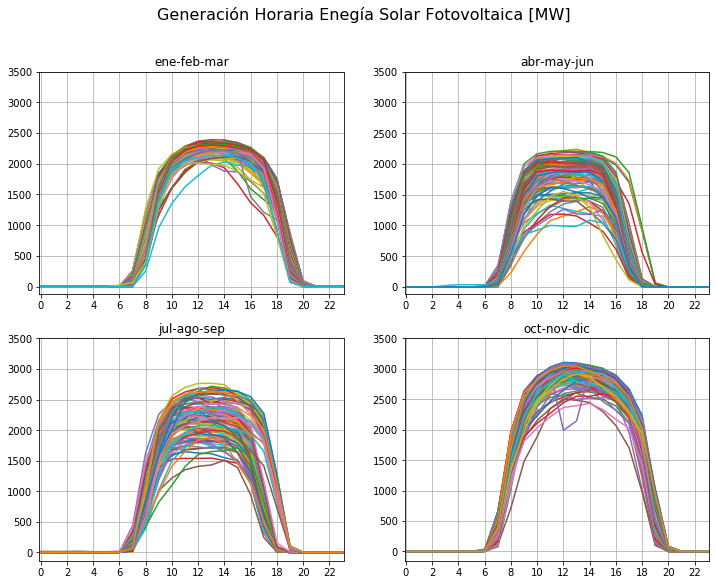

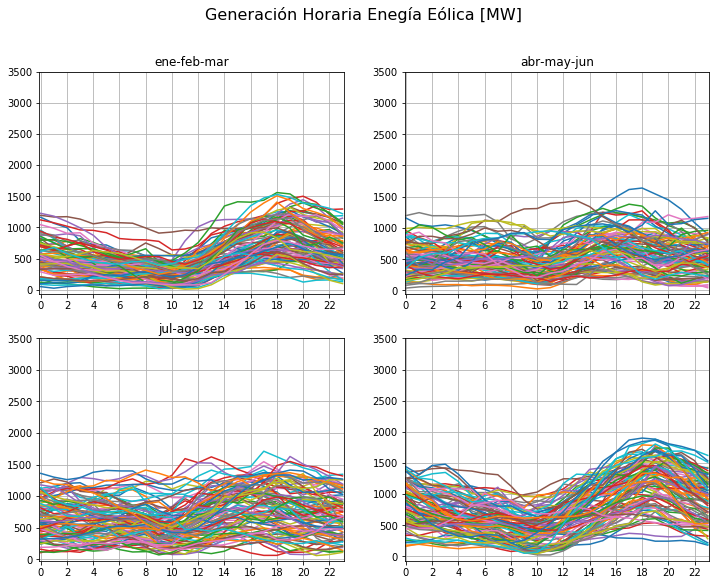

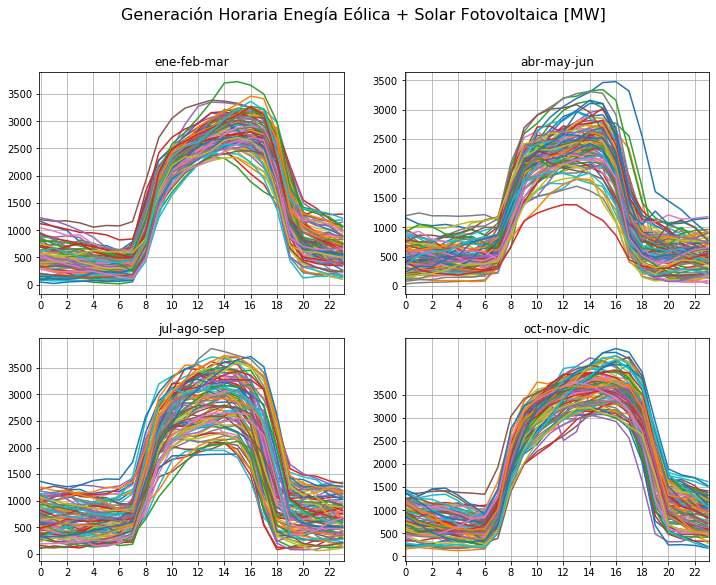

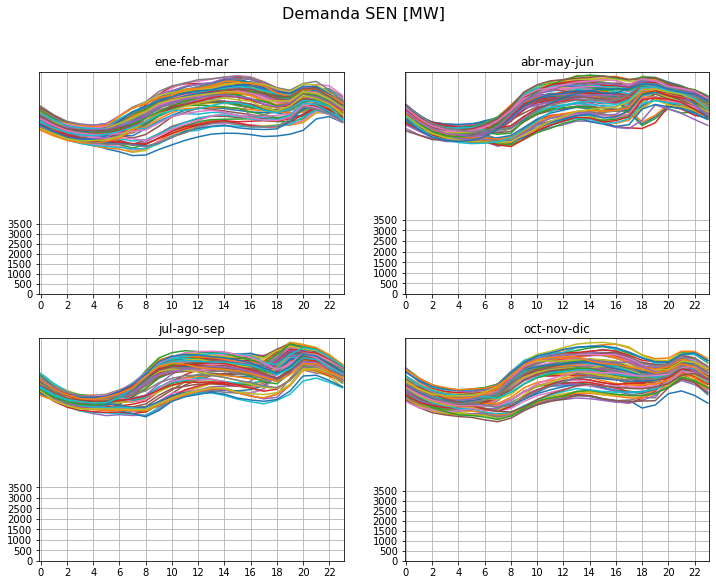

In [299]:
def plot_estaciones(df,titulo=None):
    verano = df.iloc[:,0:90]
    otoño = df.iloc[:,90:181]
    invierno = df.iloc[:,181:273]
    primavera = df.iloc[:,273:]
    m=3501
    n=500
    x=0
    
    plt.figure(figsize=(12,9))
    plt.suptitle(titulo, fontsize=16)
    plt.subplot(2,2,1)
    plt.plot(verano)
    plt.xlim([-0.1,23.1])
    plt.xticks(range(0,24,2))
    plt.yticks(range(x,m, n))
    plt.grid()
    plt.title('ene-feb-mar')

    plt.subplot(2,2,2)
    plt.plot(otoño)
    plt.title('abr-may-jun')
    plt.xlim([-0.1,23.1])
    plt.xticks(range(0,24,2))
    plt.yticks(range(x,m, n))
    plt.grid()

    plt.subplot(2,2,3)
    plt.plot(invierno)
    plt.title('jul-ago-sep')
    plt.xlim([-0.1,23.1])
    plt.xticks(range(0,24,2))
    plt.yticks(range(x,m, n))
    plt.grid()

    plt.subplot(2,2,4)
    plt.plot(primavera)
    plt.title('oct-nov-dic')
    plt.xlim([-0.1,23.1])
    plt.xticks(range(0,24,2))
    plt.yticks(range(x,m, n))
    plt.grid()

plot_estaciones(solar, 'Generación Horaria Enegía Solar Fotovoltaica [MW]')
plt.savefig('generacion_diaria_solar.png')
plot_estaciones(eolica, 'Generación Horaria Enegía Eólica [MW]')
plt.savefig('generacion_diaria_eolica.png')
plot_estaciones(df, 'Generación Horaria Enegía Eólica + Solar Fotovoltaica [MW]')
plt.savefig('generacion_diaria_conjunta.png')
plot_estaciones(demanda, 'Demanda SEN [MW]')
plt.savefig('demanda_diaria.png')

## Clustering

In [69]:
pip install kneed

Note: you may need to restart the kernel to use updated packages.


In [70]:
from sklearn.cluster import KMeans
from kneed import KneeLocator

def metodo_codo(df,suptitle='',titles=['Ene - Feb - Mar', 'Abr - May - Jun', 'Jul - Ago - Sep', 'Oct - Nov - Dic']):
    df = df.transpose()
    verano = df.iloc[0:90,:]
    otoño = df.iloc[90:181,:]
    invierno = df.iloc[181:273,:]
    primavera = df.iloc[273:,:]

    l = [verano, otoño, invierno, primavera]
    
    i=-1
    plt.figure(figsize=(12,9))
    plt.suptitle(suptitle, fontsize=16)
    plt.xlabel('Cantidad de clusters',fontsize=12)
    plt.ylabel('Inertia', fontsize=12)
    for index in range(4):
        i+=1
        distancia=[]
        for n in range(2,15,1):
            model = KMeans(n_clusters=n)
            model.fit(l[i])
            distancia.append(model.inertia_)
        
        kl = KneeLocator(range(2,15),distancia,curve='convex',direction='decreasing')
        print(kl.elbow)   
        plt.subplot(2,2,i+1)
        plt.title(f"{titles[i]}")
        plt.plot(range(2,15,1), distancia)
        plt.xticks(range(2,16))
        plt.grid() 

        
def plot_centroides(df, k, titles=['Ene - Feb - Mar', 'Abr - May - Jun', 'Jul - Ago - Sep', 'Oct - Nov - Dic']):
    df = df.transpose()
    verano = df.iloc[0:90,:]
    otoño = df.iloc[90:181,:]
    invierno = df.iloc[181:273,:]
    primavera = df.iloc[273:,:]
    l = [verano, otoño, invierno, primavera]
        
    plt.figure(figsize=(12,9))
    plt.suptitle('Centroides de cada cluster', fontsize=16)
    i=0
    for n in k:        
        model = KMeans(n_clusters=n)
        model.fit(l[i])
        i+=1
        a = model.cluster_centers_
        plt.subplot(2,2,i)
        plt.plot(np.transpose(l[i-1].values), '--', alpha=0.1, color='gray')
        plt.plot(np.transpose(a))
        plt.title(titles[i-1])
        plt.xlim([-0.1,23.1])
        plt.xticks(range(0,24,2))
        plt.grid()

## Método del codo

Cuando se realizar clustering no supervisado, una forma práctica de estimar cuantos clusters corresponden a los datos presentados, es utilizar el método del codo, el cual, como su nombre lo dice consiste en encontrar el "codo" en que la suma de las distancias de cada muestra a los centroides de su respectivo cluster, esta aumenta considerablemente si se utiliza un cluster menos y no disminuye significativamente al utilizar un cluster más.

5
5
5
5


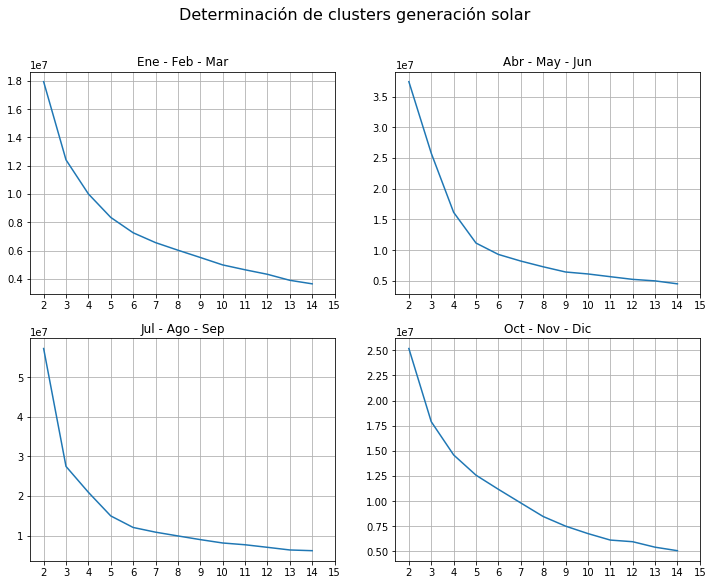

In [18]:
solar = solar.interpolate(axis=1)
metodo_codo(solar,'Determinación de clusters generación solar')
plt.savefig('codo_solar.png')

Los clusters correspondientes a cada gráfica según el método del codo corresponden a:
1. Figura superior izquierda: En verano se aprecian 5 clusters.
2. Figura superior derecha: En Otoño se aprecian 5 clusters.
3. Figura inferior izquierda: En invierno se aprecian 5 clusters.
4. Figura inferior derecha: En primavera se aprecian 6 clusters.

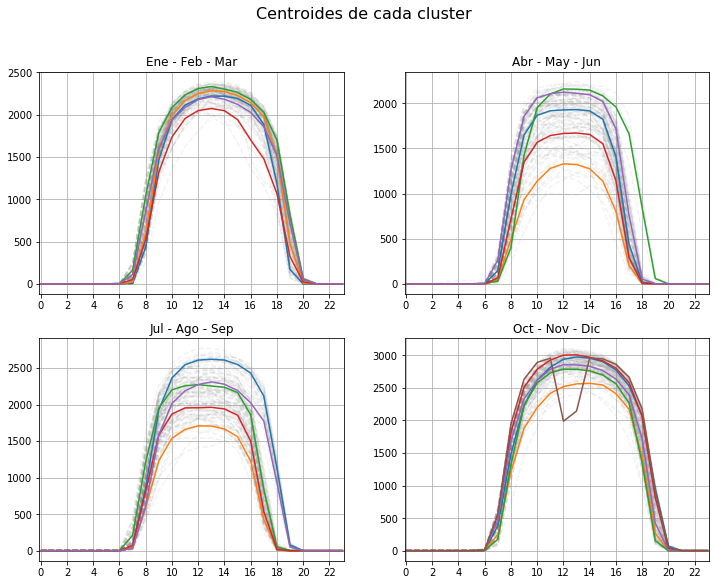

In [19]:
plot_centroides(solar, [5,5,5,6])
plt.savefig('clusters_solar.png')

6
5
6
7


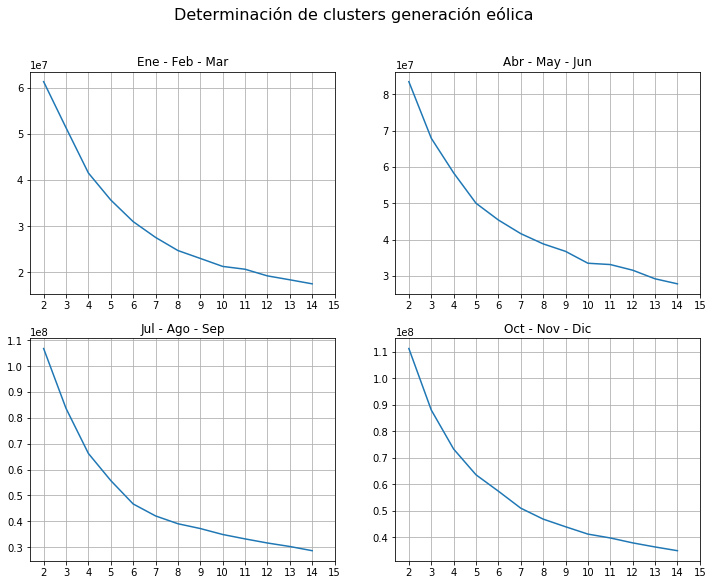

In [20]:
eolica =eolica.interpolate(axis=1)
metodo_codo(eolica,'Determinación de clusters generación eólica')
plt.savefig('codo_eolica.png')

Los clusters correspondientes a cada gráfica según el método del codo corresponden a:
1. Figura superior izquierda: En verano se aprecian 6 clusters.
2. Figura superior derecha: En Otoño se aprecian 6 clusters.
3. Figura inferior izquierda: En invierno se aprecian 6 clusters.
4. Figura inferior derecha: En primavera se aprecian 5 clusters.

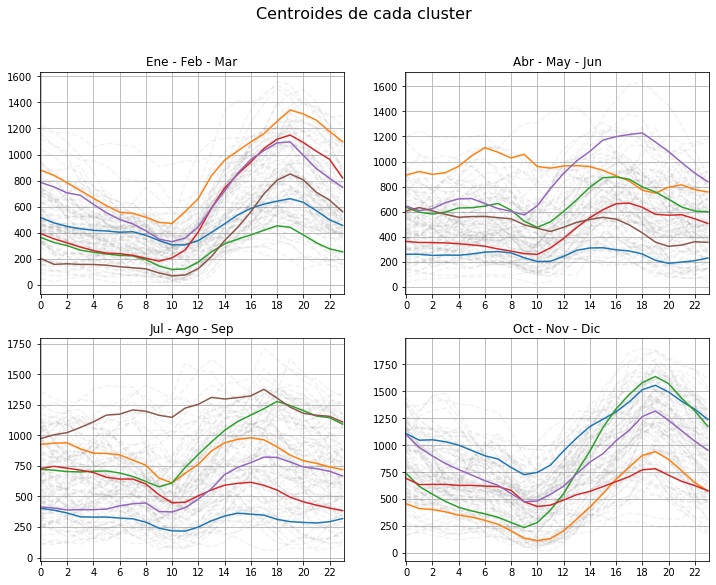

In [21]:
plot_centroides(eolica, [6,6,6,5])
plt.savefig('clusters_eólica.png')

6
6
6
6


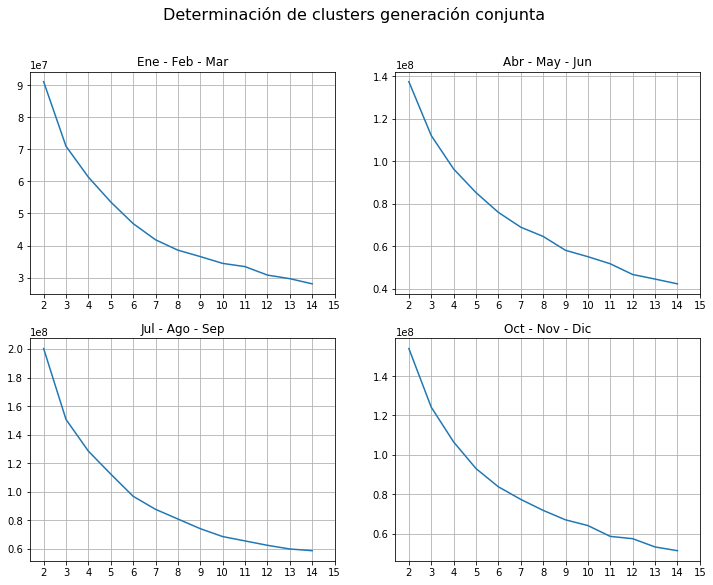

In [22]:
df = df.interpolate(axis=1)
metodo_codo(df,'Determinación de clusters generación conjunta')
plt.savefig('codo_conjunto.png')

Los clusters correspondientes a cada gráfica según el método del codo corresponden a:
1. Figura superior izquierda: En verano se aprecian 6 clusters.
2. Figura superior derecha: En Otoño se aprecian 6 clusters.
3. Figura inferior izquierda: En invierno se aprecian 6 clusters.
4. Figura inferior derecha: En primavera se aprecian 6 clusters.

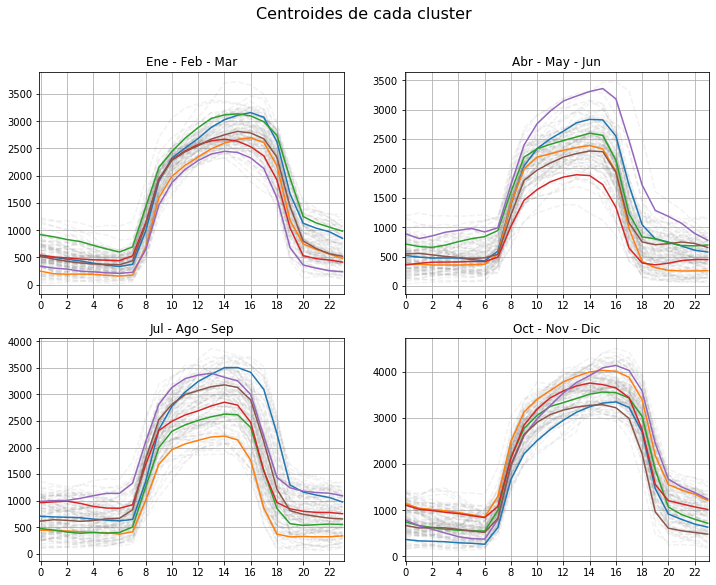

In [23]:
plot_centroides(df, [6,6,6,6])
plt.savefig('clusters_conjunta.png')

4
5
5
4


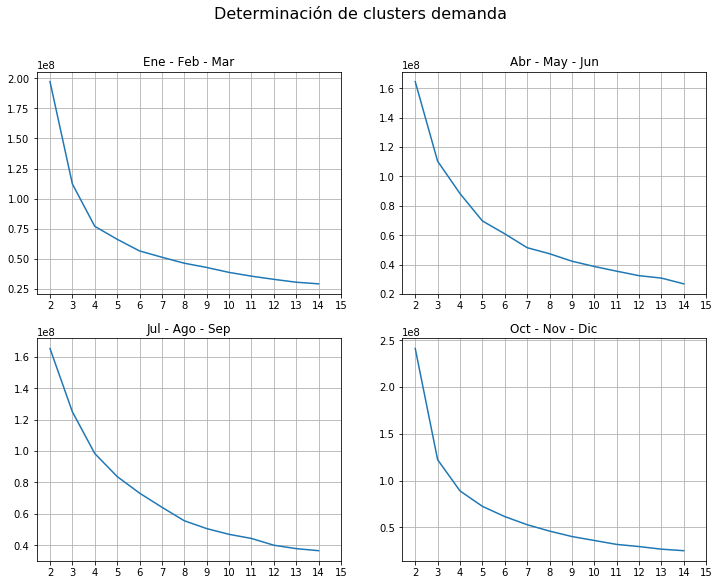

In [24]:
demanda = demanda.interpolate(axis=1)
metodo_codo(demanda, 'Determinación de clusters demanda')
plt.savefig('codo_demanda.png')

Los clusters correspondientes a cada gráfica según el método del codo corresponden a:
1. Figura superior izquierda: En verano se aprecian 4 clusters.
2. Figura superior derecha: En Otoño se aprecian 5 clusters.
3. Figura inferior izquierda: En invierno se aprecian 6 clusters.
4. Figura inferior derecha: En primavera se aprecian 4 clusters.

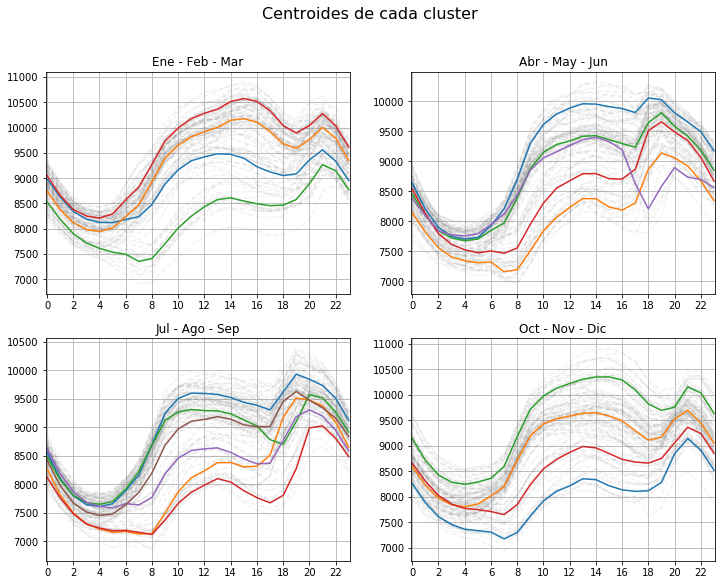

In [25]:
plot_centroides(demanda, [4,5,6,4])
plt.savefig('clusters_demanda.png')

## Correlación horaria entre los clusters de las distintas tecnologías y demanda

In [71]:
def cluster_df(df, n_clusters, nombre=''):
    if df.isna().sum().sum() > 0:
        df = df.interpolate(method='linear', axis=0, limit_direction='backward')
    model = KMeans(n_clusters=n_clusters)
    df = df.transpose()
    model.fit(df)
    a = np.transpose(model.cluster_centers_)
    columns = ['{}_cluster_{}'.format(nombre,x) for x in range(n_clusters)]
    return pd.DataFrame(a, columns=columns)
 
    
def correlacion_clusters(df1,df2,df3,df4,n=[5,5,5,5],nombres=['df1','df2','df3','df4'],title='Matriz de Correlación'):
    df1_norm = df1/df1.max().max() # normalización primer dataframe
    df2_norm = df2/df2.max().max() # normalización segundo dataframe
    df3_norm = df3/df3.max().max() # normalización tercer dataframe
    df4_norm = df4/df4.max().max() # normalización cuarto dataframe
    
    a = cluster_df(df1_norm,n[0], nombres[0])
    b = cluster_df(df2_norm,n[1], nombres[1])
    c = cluster_df(df3_norm,n[2], nombres[2])
    d = cluster_df(df4_norm,n[3], nombres[3])
    
    e = pd.concat([a,b,c,d],axis=1)
    corrM = e.corr()
    
    plt.figure(figsize=(16,8))
    sn.heatmap(corrM, annot=True)
    plt.title(title, fontsize=14)
    plt.show()
    
sol_eo = solar+eolica

## Correlación Enero - Febrero - Marzo

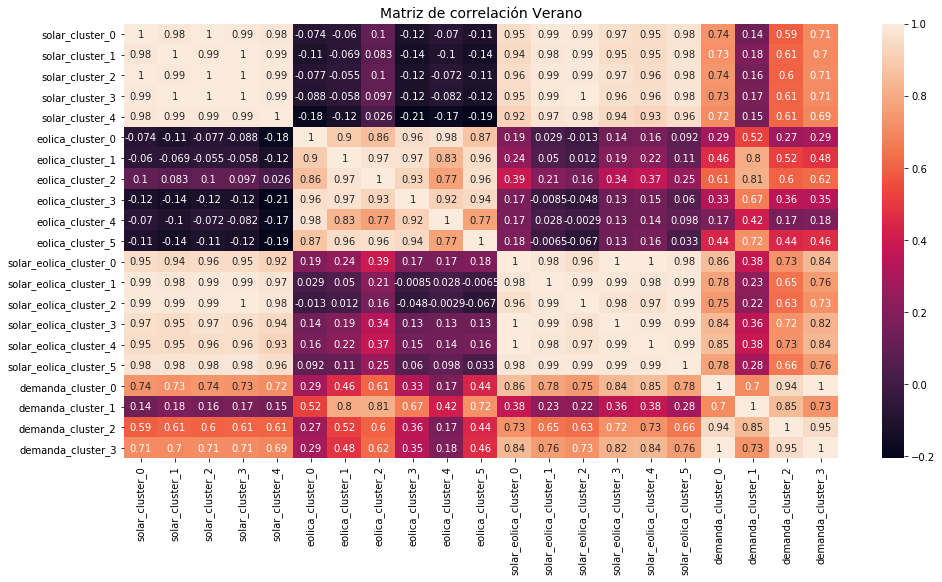

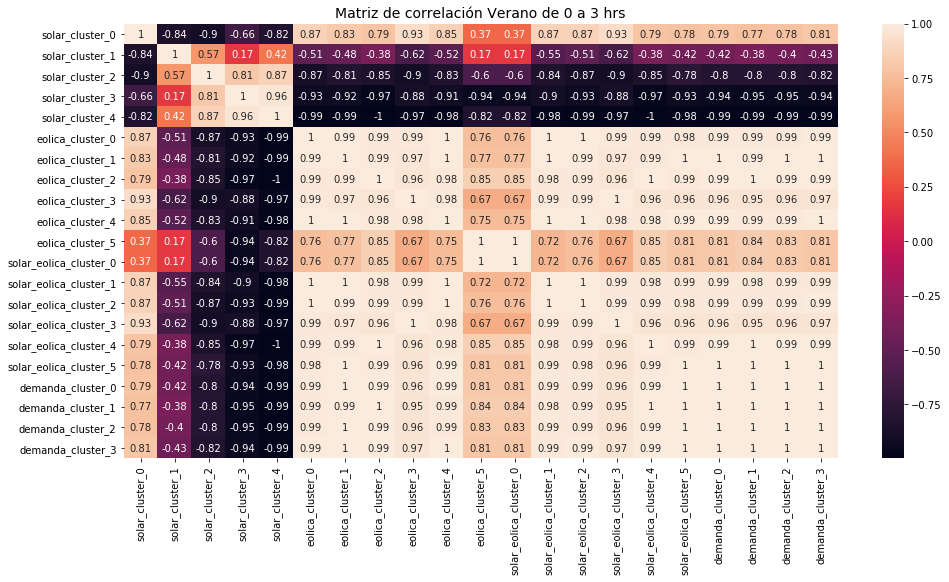

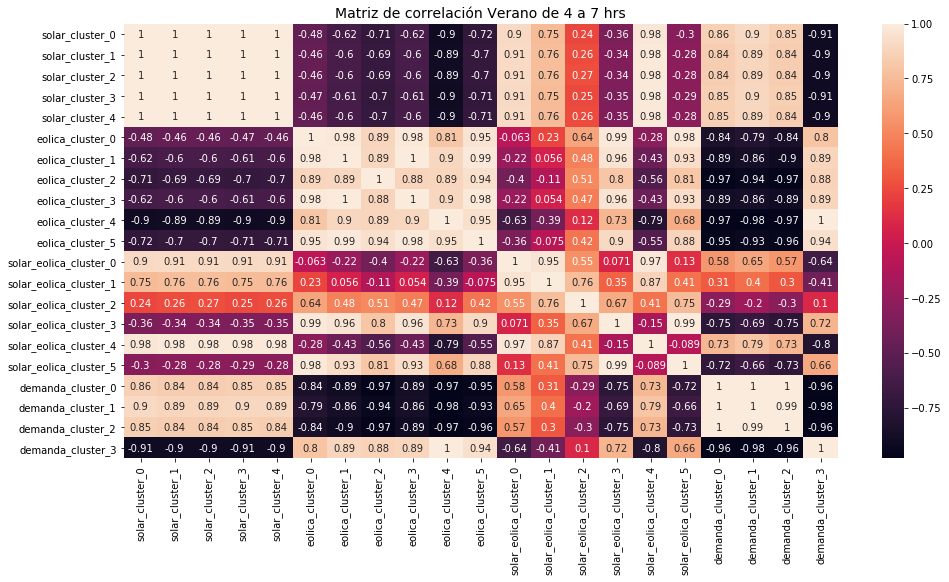

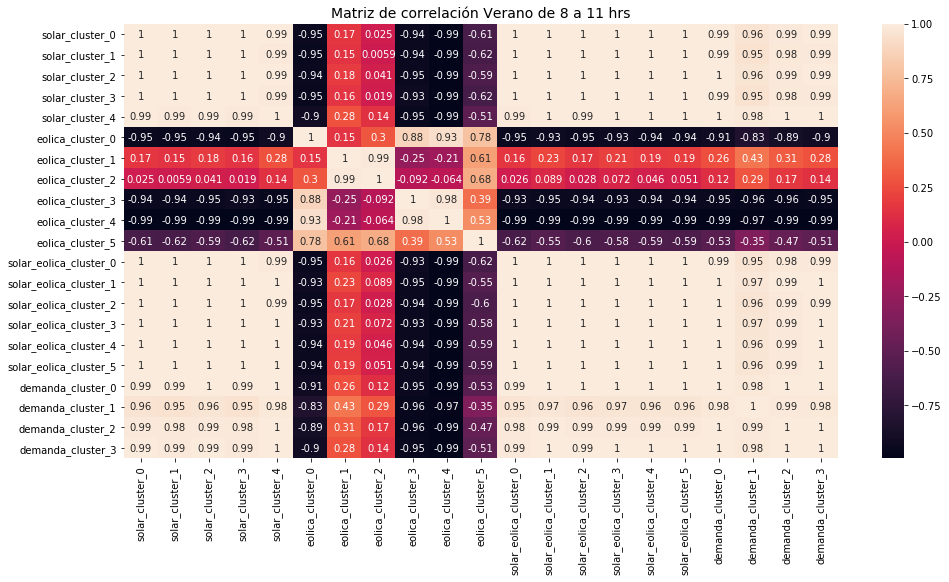

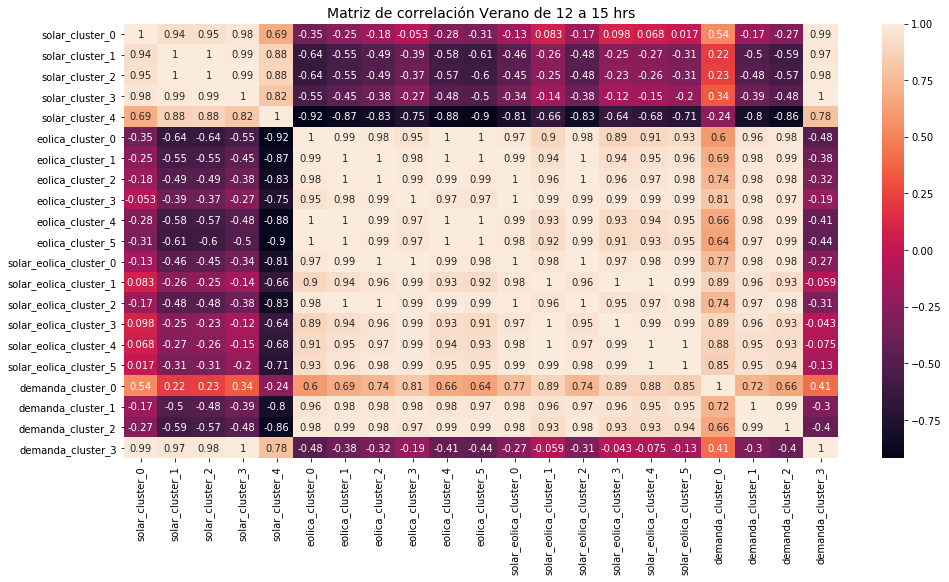

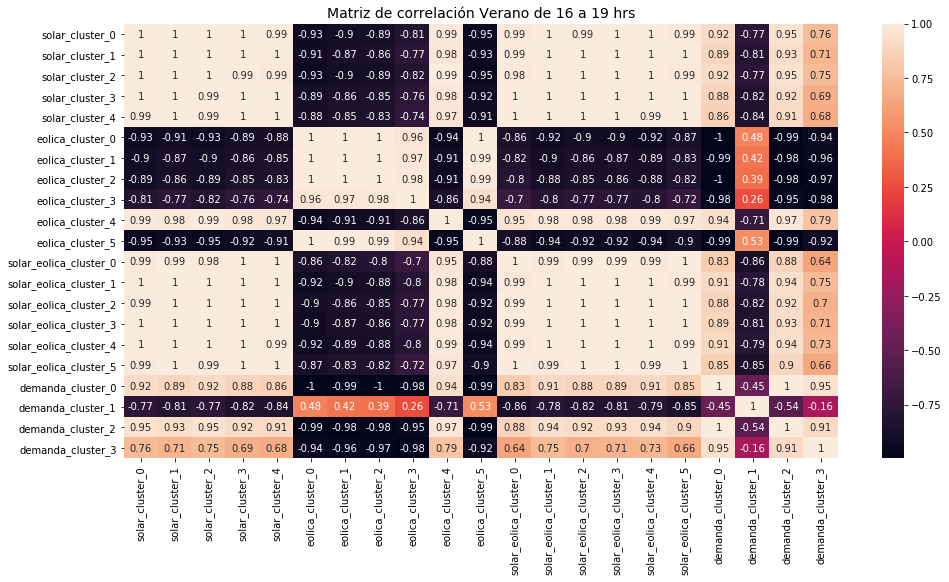

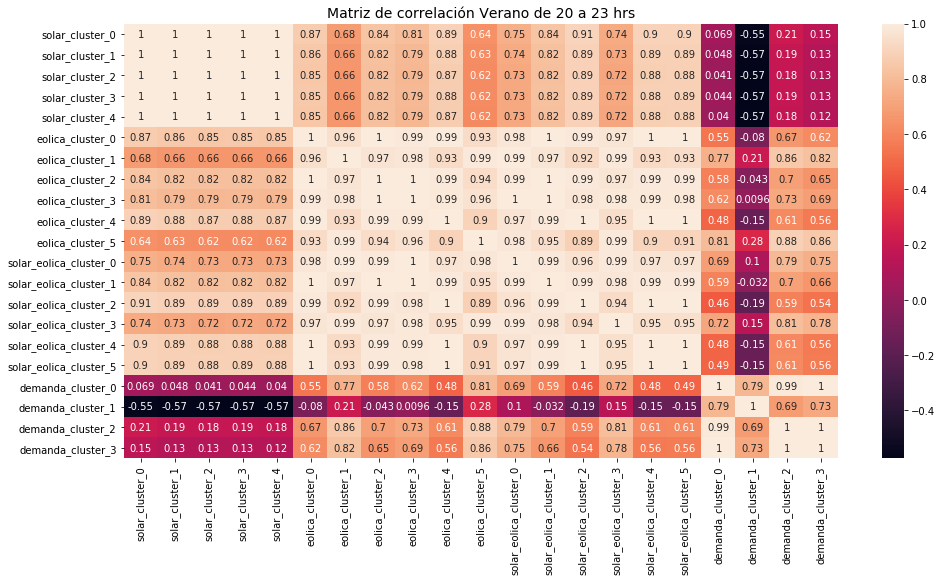

In [27]:
s_v = solar.iloc[:,:90]
e_v = eolica.iloc[:,:90]
se_v = sol_eo.iloc[:,:90]
d_v = demanda.iloc[:,:90]

nombres = ['solar', 'eolica', 'solar_eolica', 'demanda']
n = [5,6,6,4]

correlacion_clusters(s_v,e_v,se_v,d_v,nombres=nombres,n=n,title='Matriz de correlación Verano')
correlacion_clusters(s_v.iloc[0:4,:],e_v.iloc[0:4,:],se_v.iloc[0:4,:],d_v.iloc[0:4,:],
                     nombres=nombres,n=n,title='Matriz de correlación Verano de 0 a 3 hrs')
correlacion_clusters(s_v.iloc[4:8,:],e_v.iloc[4:8,:],se_v.iloc[4:8,:],d_v.iloc[4:8,:],
                     nombres=nombres,n=n,title='Matriz de correlación Verano de 4 a 7 hrs')
correlacion_clusters(s_v.iloc[8:12,:],e_v.iloc[8:12,:],se_v.iloc[8:12,:],d_v.iloc[8:12,:],
                     nombres=nombres,n=n,title='Matriz de correlación Verano de 8 a 11 hrs')
correlacion_clusters(s_v.iloc[12:16,:],e_v.iloc[12:16,:],se_v.iloc[12:16,:],d_v.iloc[12:16,:],
                     nombres=nombres,n=n,title='Matriz de correlación Verano de 12 a 15 hrs')
correlacion_clusters(s_v.iloc[16:20,:],e_v.iloc[16:20,:],se_v.iloc[16:20,:],d_v.iloc[16:20,:],
                     nombres=nombres,n=n,title='Matriz de correlación Verano de 16 a 19 hrs')
correlacion_clusters(s_v.iloc[20:24,:],e_v.iloc[20:24,:],se_v.iloc[20:24,:],d_v.iloc[20:24,:],
                     nombres=nombres,n=n,title='Matriz de correlación Verano de 20 a 23 hrs')

Observaciones Correlación Clusters en Verano:

1. Durante el verano en general, se tiene escasa correlación entre los clusters solares y eólicos, a excepción del cluster 4, que tiene una debil complementariedad de aproximadamente 0.3 con los clusters solares. Si se considera la generación solar y eólica conjunta, al compararla con los 4 clusters de la demanda, se tienen 2 clusters con una correlación de aproximadamente 0.8, es decir se mueven junto con la demanda, otro cluster con una correlación un poco menor de aproximadamente 0.7 y por último, una debil correlación de aproximadamente 0.3.

2. Al analizar por en ventanas de 4 horas, se tiene el primer bloque de 0 a 3 hrs, en donde no hay producción solar y la energía eólica entrega una correlación casi perfecta con la demanda.

3. En el bloque de 4 a 7 aún no se presenta generación solar, y los 6 clusters eólicos se muestran distintas situaciones con los 4 clusters de demanda, 3 de 4 tienen alta complementariedad con todos los clusters eólicos y 1 cluster de demanda tiene alta correlación con todos los clusters eólicos.

4. De 8 a 11 empieza la generación solar, y al comparar con la generación eólica, se tiene 3 clusters eólicos con alta complementariedad cerca del 0.99, uno con mediana complementariedad (0.5 aprox) y 2 con escasa relación (cercanos a 0). Por otro lado, se observa que el 100% de los clusters comparados con la demanda, guardan un muy alto nivel de sincronismo (mayor que 0.95).

5. De 12 a 15 horas se observan comportamientos de complementariedad moderada en el 50% de los clusters entre la generación solar y demanda, mientras que el otro 50% es de sincronismo, esto pues durante este periodo, la generación tiende a disminuir su producción, y la demanda sigue este patrón en unos casos, y en otros tiende a mantenerse en este bloque. Sin embargo, al considerar la energía eólica y solar, en el 75% de los casos se tiene un alto nivel de sincronismo (>0.8), y en el 25% restante, tienen escasa relación con la demanda (~0).

6. De 16 a 19 se observa que la generación solar y eólica tienen una alta complementariedad en todos sus clusters, debido a que es la ventana en que se empieza a disminuir drásticamente la generación solar y la eólica aumenta. Por otro lado, se tiene un alto nivel de sincronismo (>0.6) en el 75% de los casos, mientras que en el otro 25% es un alto nivel de complementariedad (<-0.7).

7. De 20 a 23 horas en el 75% de los casos se tiene un sincronismo moderado con la demanda (entre 0.5 y 0.8), puesto que la generación solar ya no está presente, y la eólica tiende a disminuir, mientras que la demanda tiende a subir hasta las 21 hrs, para luego comenzar a disminuir, mientras que en el 25% restante no tienen correlación estas variables. 

Se puede concluir que generalmente en el 75% de los casos, la generación solar más la eólica, tienen un comportamiento de sincronismo con la demanda a excepción de la ventana entre las 4 y 7 horas en que se tiene lo opuesto.

## Correlación Abril - Mayo - Junio

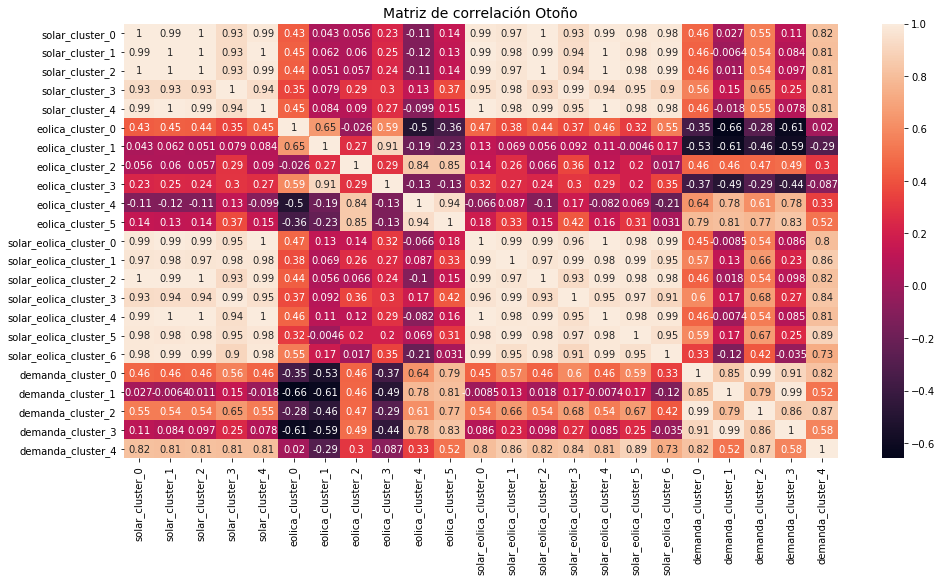

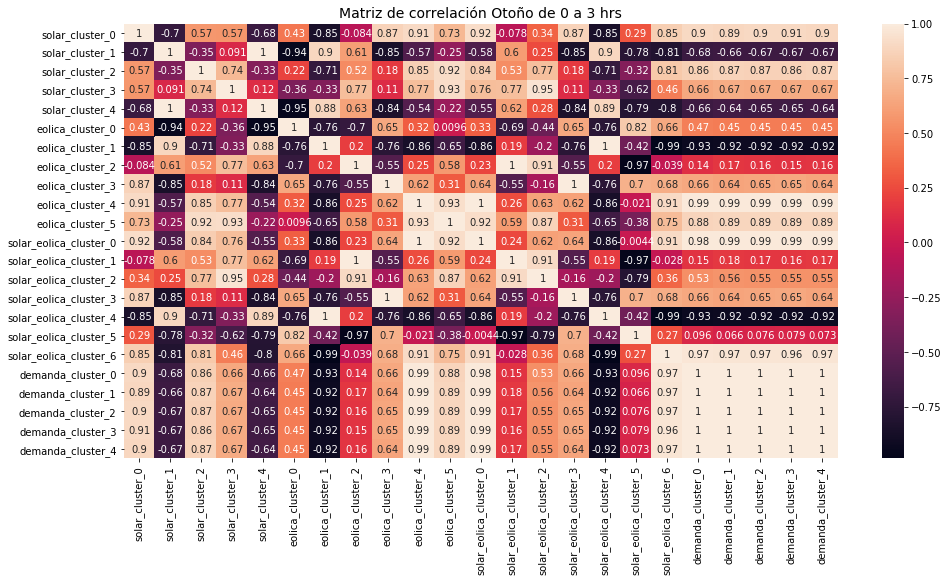

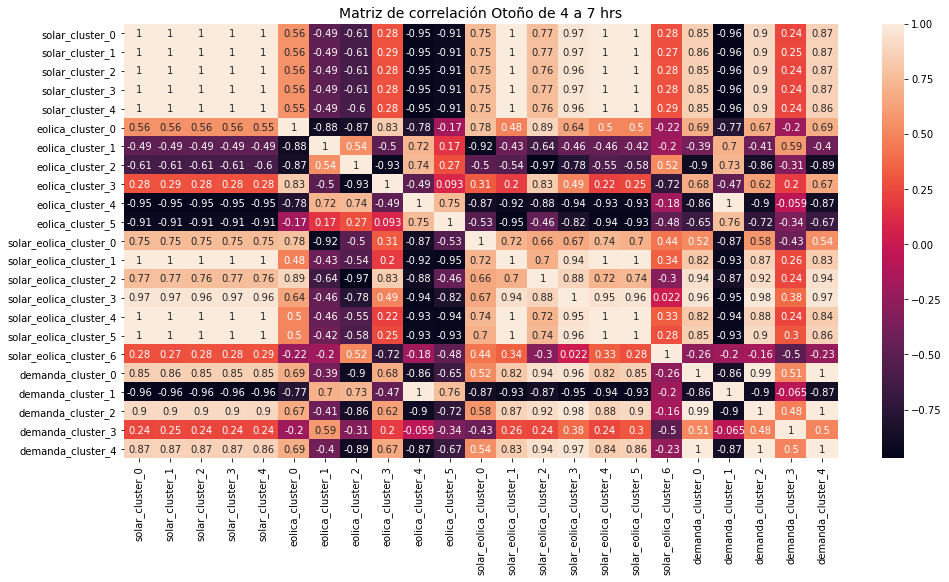

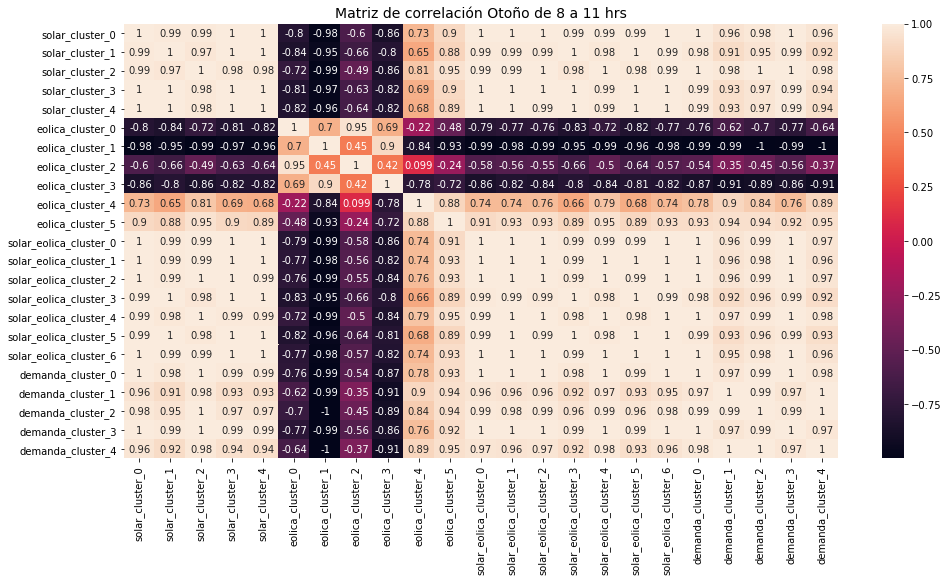

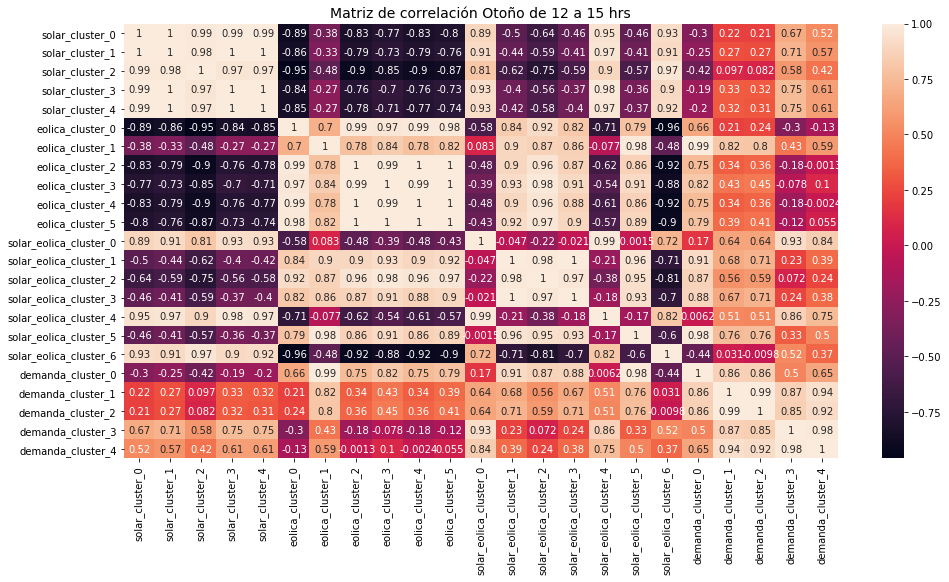

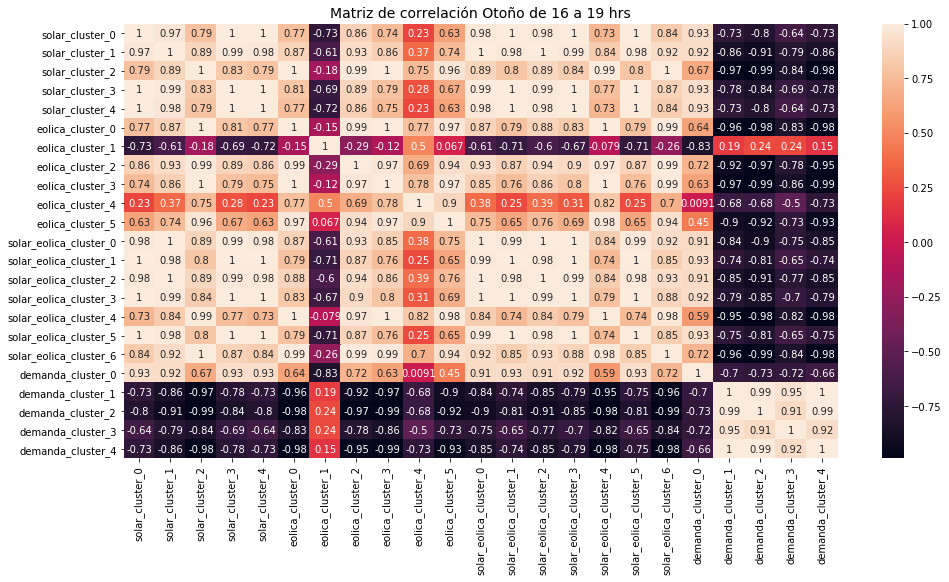

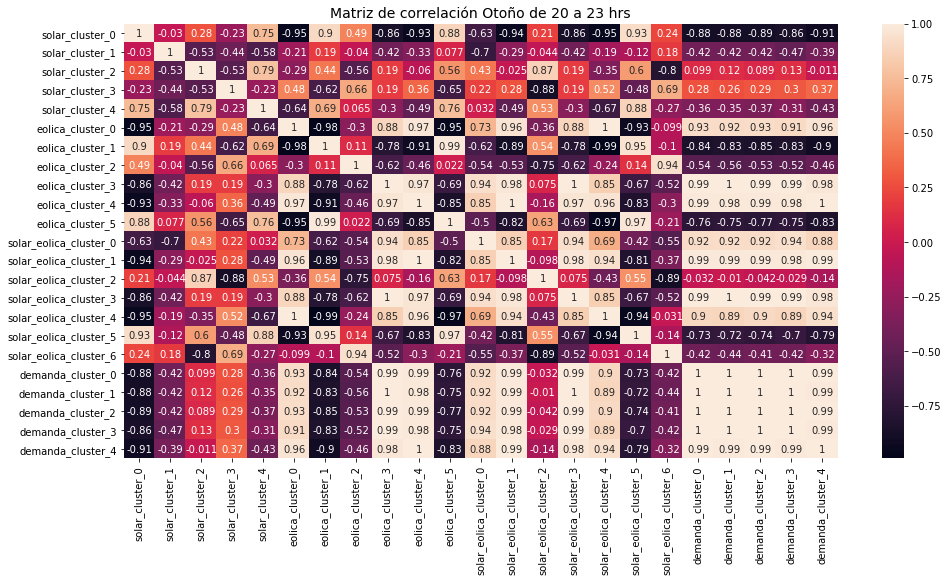

In [28]:
s_v = solar.iloc[:,90:181]
e_v = eolica.iloc[:,90:181]
se_v = sol_eo.iloc[:,90:181]
d_v = demanda.iloc[:,90:181]

n=[5,6,7,5]

correlacion_clusters(s_v,e_v,se_v,d_v,nombres=nombres,n=n,title='Matriz de correlación Otoño')
correlacion_clusters(s_v.iloc[0:4,:],e_v.iloc[0:4,:],se_v.iloc[0:4,:],d_v.iloc[0:4,:],
                     nombres=nombres,n=n,title='Matriz de correlación Otoño de 0 a 3 hrs')
correlacion_clusters(s_v.iloc[4:8,:],e_v.iloc[4:8,:],se_v.iloc[4:8,:],d_v.iloc[4:8,:],
                     nombres=nombres,n=n,title='Matriz de correlación Otoño de 4 a 7 hrs')
correlacion_clusters(s_v.iloc[8:12,:],e_v.iloc[8:12,:],se_v.iloc[8:12,:],d_v.iloc[8:12,:],
                     nombres=nombres,n=n,title='Matriz de correlación Otoño de 8 a 11 hrs')
correlacion_clusters(s_v.iloc[12:16,:],e_v.iloc[12:16,:],se_v.iloc[12:16,:],d_v.iloc[12:16,:],
                     nombres=nombres,n=n,title='Matriz de correlación Otoño de 12 a 15 hrs')
correlacion_clusters(s_v.iloc[16:20,:],e_v.iloc[16:20,:],se_v.iloc[16:20,:],d_v.iloc[16:20,:],
                     nombres=nombres,n=n,title='Matriz de correlación Otoño de 16 a 19 hrs')
correlacion_clusters(s_v.iloc[20:24,:],e_v.iloc[20:24,:],se_v.iloc[20:24,:],d_v.iloc[20:24,:],
                     nombres=nombres,n=n,title='Matriz de correlación Otoño de 20 a 23 hrs')

## Correlación Julio - Agosto - Septiembre

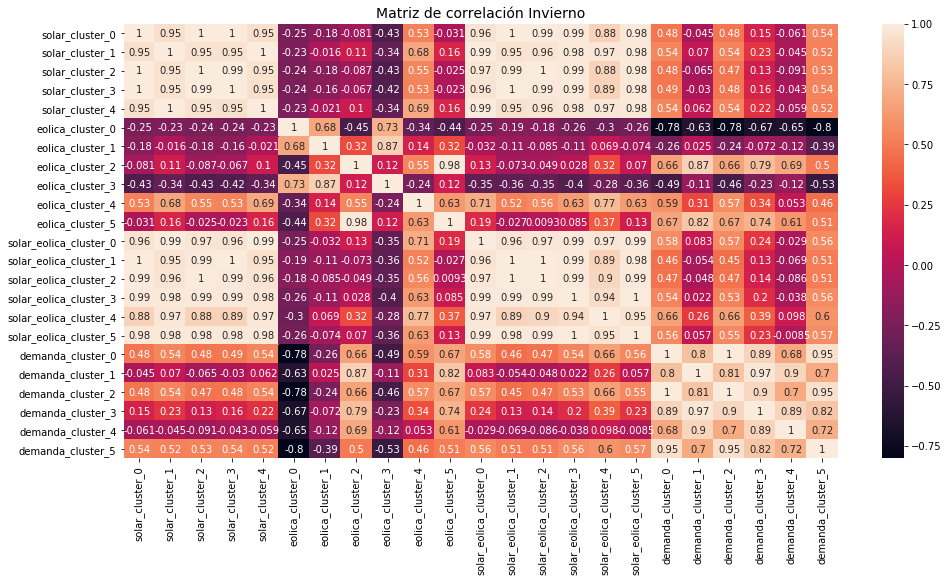

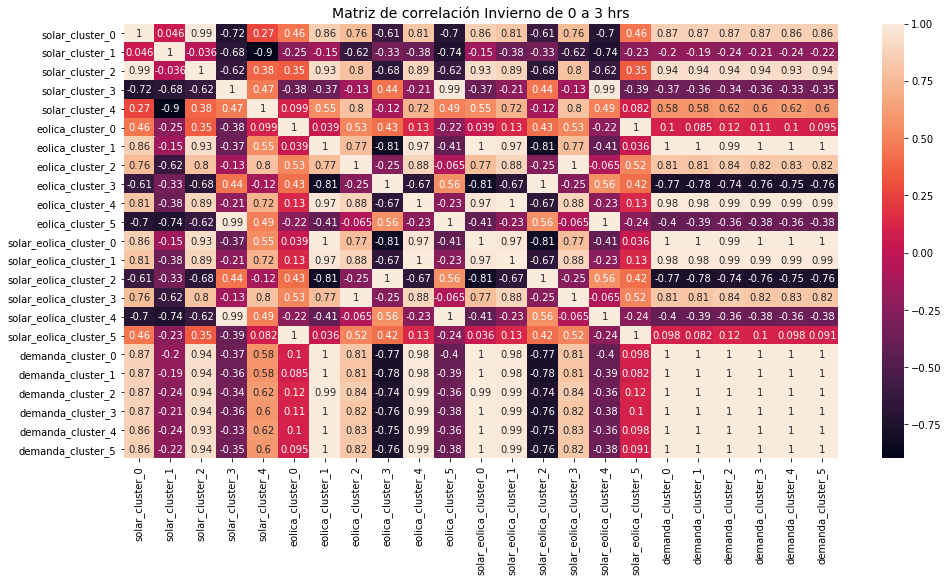

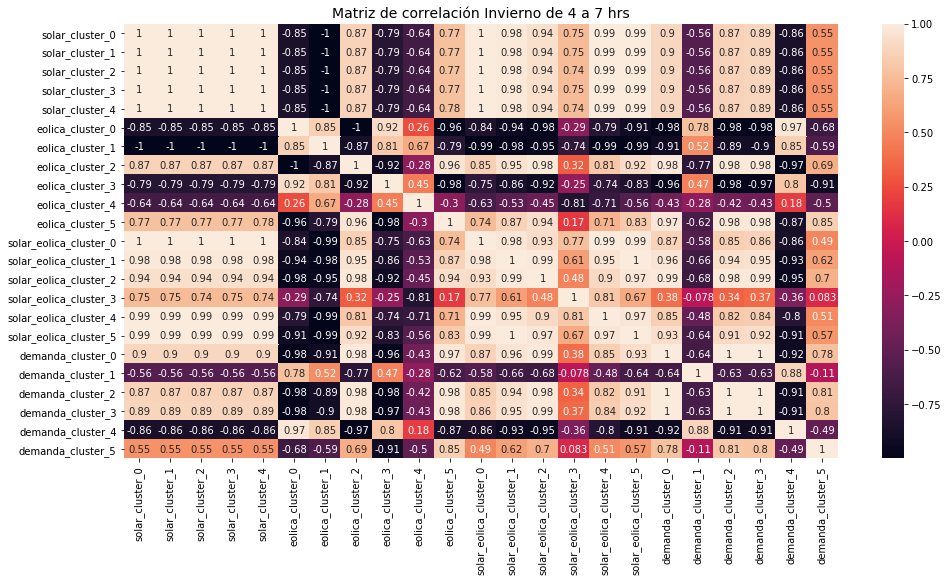

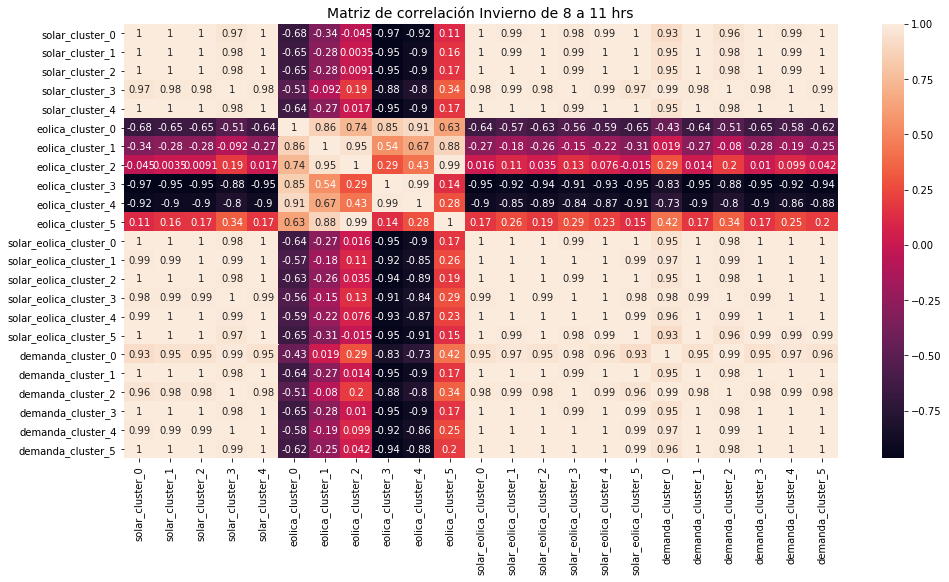

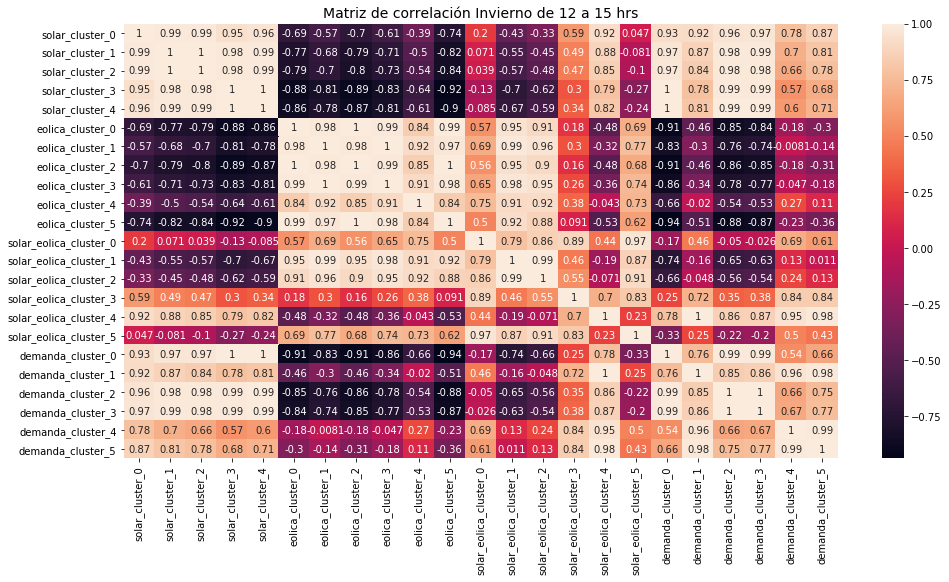

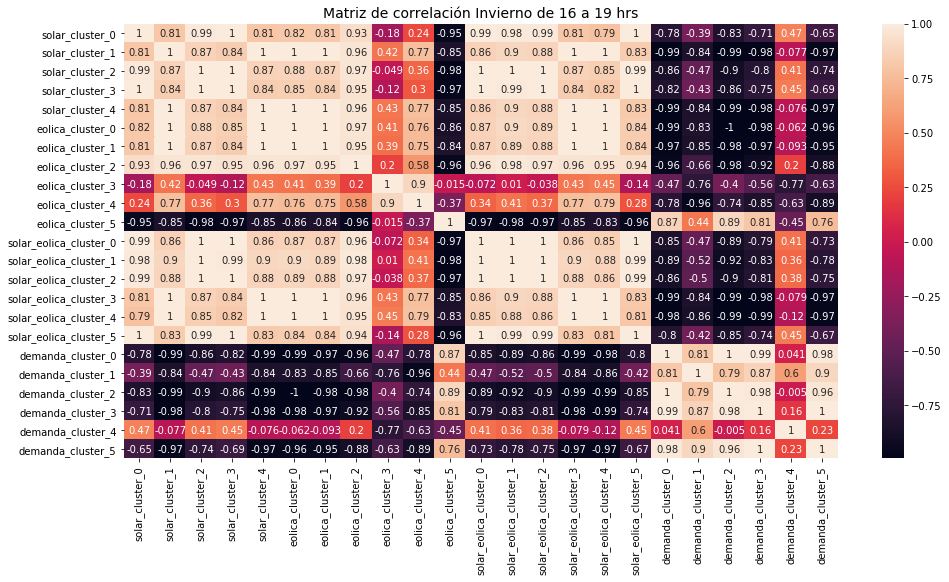

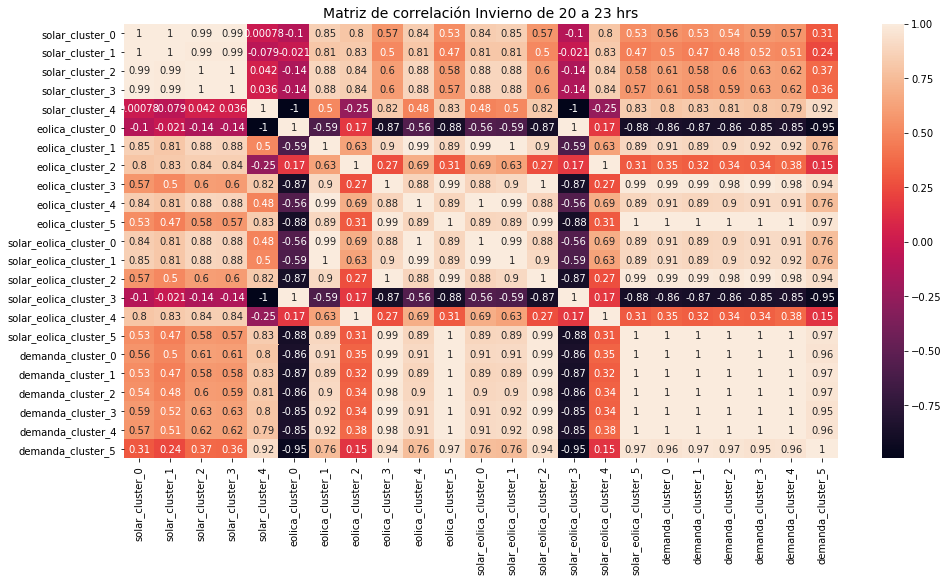

In [29]:
s_v = solar.iloc[:,181:273]
e_v = eolica.iloc[:,181:273]
se_v = sol_eo.iloc[:,181:273]
d_v = demanda.iloc[:,181:273]

n = [5,6,6,6]

correlacion_clusters(s_v,e_v,se_v,d_v,nombres=nombres,n=n,title='Matriz de correlación Invierno')
correlacion_clusters(s_v.iloc[0:4,:],e_v.iloc[0:4,:],se_v.iloc[0:4,:],d_v.iloc[0:4,:],
                     nombres=nombres,n=n,title='Matriz de correlación Invierno de 0 a 3 hrs')
correlacion_clusters(s_v.iloc[4:8,:],e_v.iloc[4:8,:],se_v.iloc[4:8,:],d_v.iloc[4:8,:],
                     nombres=nombres,n=n,title='Matriz de correlación Invierno de 4 a 7 hrs')
correlacion_clusters(s_v.iloc[8:12,:],e_v.iloc[8:12,:],se_v.iloc[8:12,:],d_v.iloc[8:12,:],
                     nombres=nombres,n=n,title='Matriz de correlación Invierno de 8 a 11 hrs')
correlacion_clusters(s_v.iloc[12:16,:],e_v.iloc[12:16,:],se_v.iloc[12:16,:],d_v.iloc[12:16,:],
                     nombres=nombres,n=n,title='Matriz de correlación Invierno de 12 a 15 hrs')
correlacion_clusters(s_v.iloc[16:20,:],e_v.iloc[16:20,:],se_v.iloc[16:20,:],d_v.iloc[16:20,:],
                     nombres=nombres,n=n,title='Matriz de correlación Invierno de 16 a 19 hrs')
correlacion_clusters(s_v.iloc[20:24,:],e_v.iloc[20:24,:],se_v.iloc[20:24,:],d_v.iloc[20:24,:],
                     nombres=nombres,n=n,title='Matriz de correlación Invierno de 20 a 23 hrs')

## Correlación Octubre - Noviembre - Diciembre

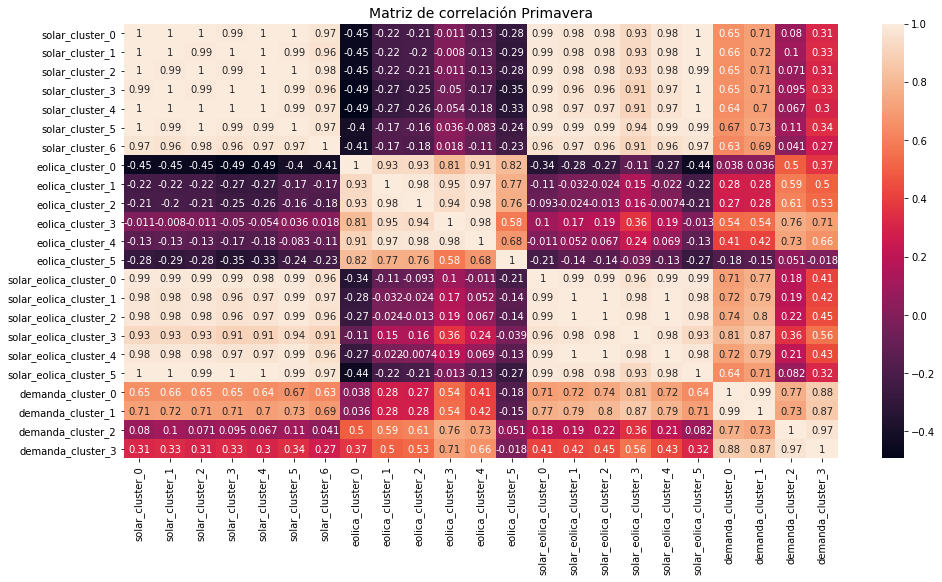

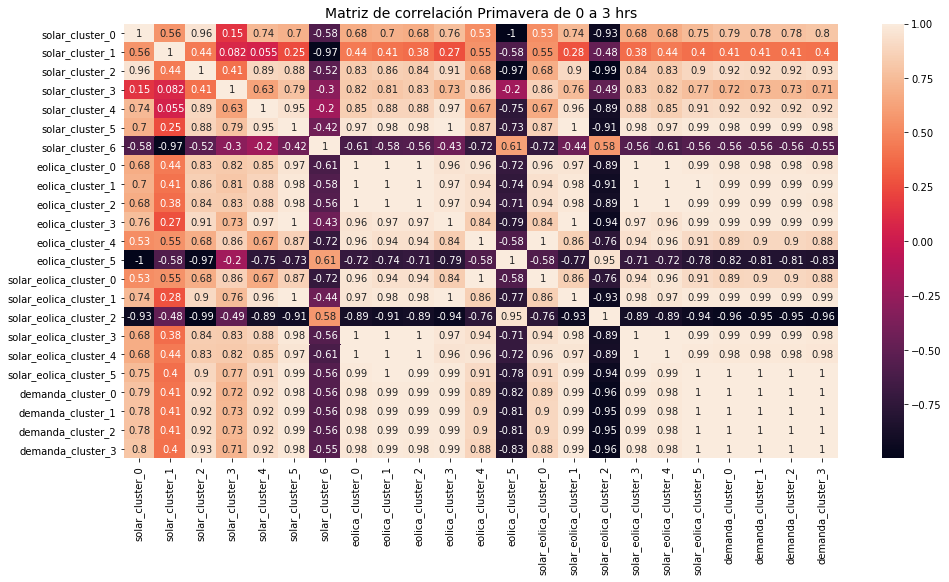

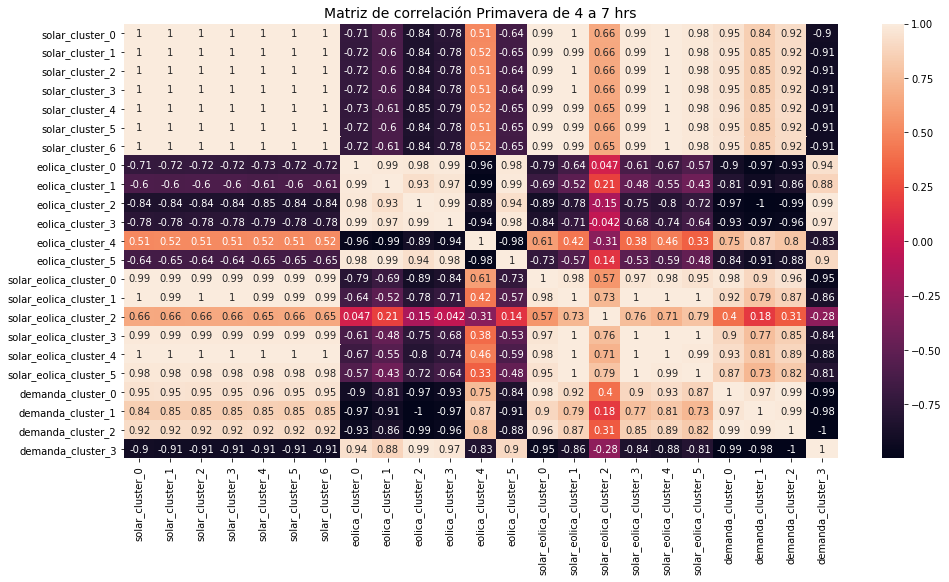

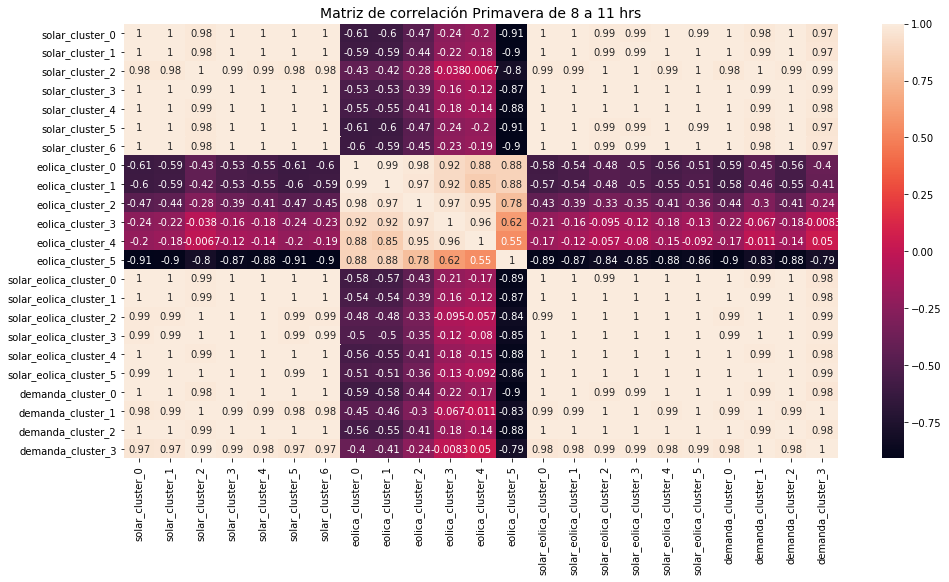

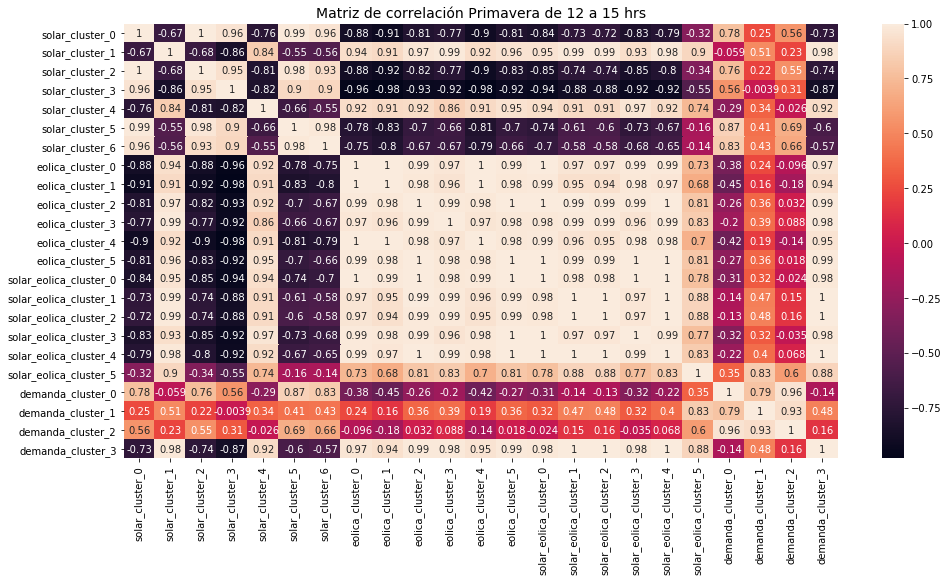

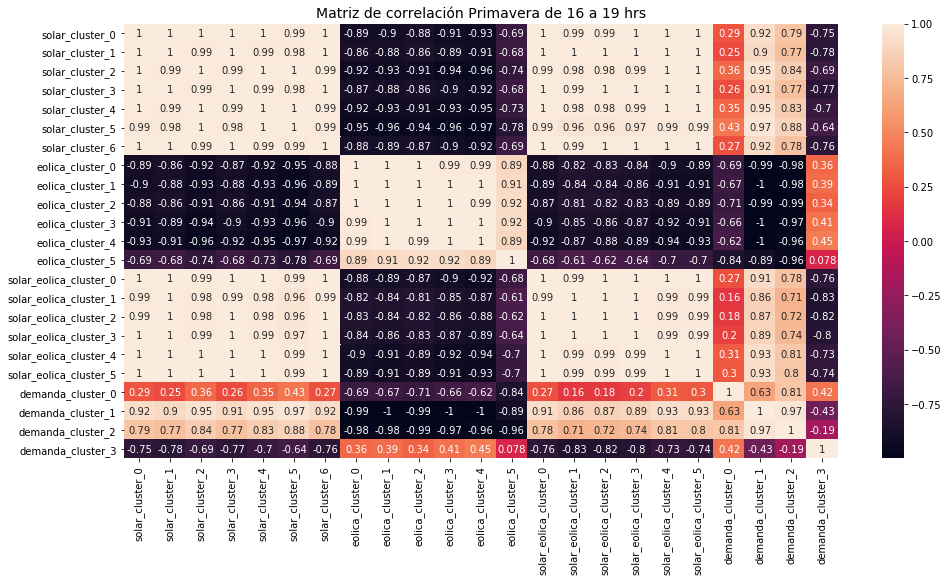

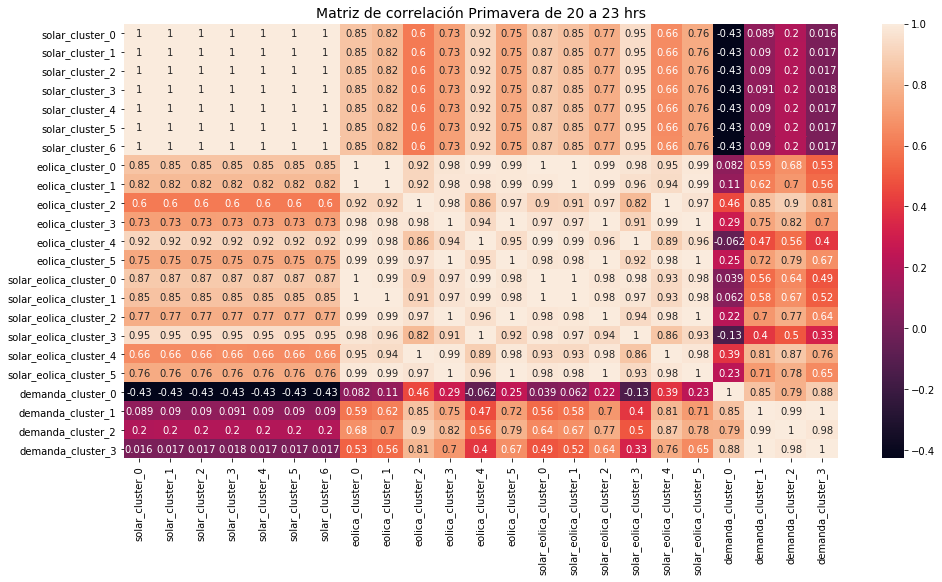

In [30]:
s_v = solar.iloc[:,273:]
e_v = eolica.iloc[:,273:]
se_v = sol_eo.iloc[:,273:]
d_v = demanda.iloc[:,273:]

n = [7,6,6,4]

correlacion_clusters(s_v,e_v,se_v,d_v,nombres=nombres,n=n,title='Matriz de correlación Primavera')
correlacion_clusters(s_v.iloc[0:4,:],e_v.iloc[0:4,:],se_v.iloc[0:4,:],d_v.iloc[0:4,:],
                     nombres=nombres,n=n,title='Matriz de correlación Primavera de 0 a 3 hrs')
correlacion_clusters(s_v.iloc[4:8,:],e_v.iloc[4:8,:],se_v.iloc[4:8,:],d_v.iloc[4:8,:],
                     nombres=nombres,n=n,title='Matriz de correlación Primavera de 4 a 7 hrs')
correlacion_clusters(s_v.iloc[8:12,:],e_v.iloc[8:12,:],se_v.iloc[8:12,:],d_v.iloc[8:12,:],
                     nombres=nombres,n=n,title='Matriz de correlación Primavera de 8 a 11 hrs')
correlacion_clusters(s_v.iloc[12:16,:],e_v.iloc[12:16,:],se_v.iloc[12:16,:],d_v.iloc[12:16,:],
                     nombres=nombres,n=n,title='Matriz de correlación Primavera de 12 a 15 hrs')
correlacion_clusters(s_v.iloc[16:20,:],e_v.iloc[16:20,:],se_v.iloc[16:20,:],d_v.iloc[16:20,:],
                     nombres=nombres,n=n,title='Matriz de correlación Primavera de 16 a 19 hrs')
correlacion_clusters(s_v.iloc[20:24,:],e_v.iloc[20:24,:],se_v.iloc[20:24,:],d_v.iloc[20:24,:],
                     nombres=nombres,n=n,title='Matriz de correlación Primavera de 20 a 23 hrs')

## Clustering por unidad generadora

In [344]:
df = cargar_dataset()
solar = df[df['central_tipo']=='Solar'] #Datos de las centrales solares.
eolica = df[df['central_tipo']=='Eólica'] # Datos de las centrales eólicas.

df=pd.concat([eolica,solar])

def normalizar_centrales(df):
    df = df.loc[(df.isna().sum(axis=1) <= 0),:] # Se dejan solo las centrales que hayan operado durante todo el año
    df =df.div(df.max(axis=1), axis=0).fillna(0) #normalización de datos
    return df

solar = solar.pivot_table(index='central_nombre', columns='time',values='generacion_real_mwh')
solar = normalizar_centrales(solar)

eolica = eolica.pivot_table(index='central_nombre', columns='time',values='generacion_real_mwh')
eolica = normalizar_centrales(eolica)

df=df.pivot_table(index='central_nombre', columns='time',values='generacion_real_mwh')

In [345]:
df = df.loc[(df.isna().sum(axis=1) <= 0),:] # Se dejan solo las centrales que hayan operado durante todo el año
df =df.div(df.max(axis=1), axis=0).fillna(0) #normalización de datos
df.head()

time,2020-01-01 00:00:00,2020-01-01 01:00:00,2020-01-01 02:00:00,2020-01-01 03:00:00,2020-01-01 04:00:00,2020-01-01 05:00:00,2020-01-01 06:00:00,2020-01-01 07:00:00,2020-01-01 08:00:00,2020-01-01 09:00:00,...,2020-12-31 14:00:00,2020-12-31 15:00:00,2020-12-31 16:00:00,2020-12-31 17:00:00,2020-12-31 18:00:00,2020-12-31 19:00:00,2020-12-31 20:00:00,2020-12-31 21:00:00,2020-12-31 22:00:00,2020-12-31 23:00:00
central_nombre,,,,,,,,,,,,,,,,,,,,,
PE AURORA,0.948911,0.868509,0.576214,0.834171,0.628978,0.645729,0.668342,0.494975,0.386935,0.168342,...,0.083752,0.087102,0.199330,0.237856,0.298995,0.339196,0.369347,0.276382,0.287270,0.455611
PE CABO LEONES,0.041156,0.007005,0.000000,0.000000,0.000000,0.104203,0.256567,0.142732,0.081436,0.077058,...,0.093695,0.280210,0.577058,0.560420,0.451839,0.387040,0.247811,0.135727,0.026270,0.000000
PE CANELA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.002265,0.000566,0.003398,0.075311,0.199887,0.371461,0.351076,0.261608,0.051529,0.005663
PE CANELA II,0.005071,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.003719,0.002197,0.007099,0.101082,0.246112,0.608181,0.676978,0.458080,0.243746,0.088066
PE CUEL,0.544438,0.583434,0.475816,0.387545,0.347037,0.331923,0.311366,0.241233,0.050484,0.000907,...,0.692261,0.698609,0.575272,0.637848,0.615175,0.500907,0.710701,0.692563,0.649637,0.694680


## Unidades Solares

4


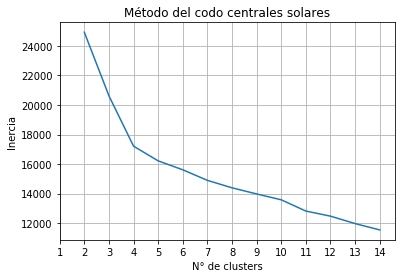

In [351]:
distancia=[]
for n in range(2,15,1):
    model = KMeans(n_clusters=n)
    model.fit(solar)
    distancia.append(model.inertia_)

kl = KneeLocator(range(2,15),distancia,curve='convex',direction='decreasing')
print(kl.elbow)
plt.plot(range(2,15,1),distancia)
plt.xticks(range(1,15,1))
plt.grid()
plt.title('Método del codo centrales solares')
plt.xlabel('N° de clusters')
plt.ylabel('Inercia')
plt.show()

In [362]:
def asignar_clase(df, n_clusters):
    model = KMeans(n_clusters=n_clusters)
    model.fit(df)
    clase=model.predict(df)
    df['clase'] = clase
    return df

solar = asignar_clase(solar,kl.elbow)
solar.head()

time,2020-01-01 00:00:00,2020-01-01 01:00:00,2020-01-01 02:00:00,2020-01-01 03:00:00,2020-01-01 04:00:00,2020-01-01 05:00:00,2020-01-01 06:00:00,2020-01-01 07:00:00,2020-01-01 08:00:00,2020-01-01 09:00:00,...,2020-12-31 15:00:00,2020-12-31 16:00:00,2020-12-31 17:00:00,2020-12-31 18:00:00,2020-12-31 19:00:00,2020-12-31 20:00:00,2020-12-31 21:00:00,2020-12-31 22:00:00,2020-12-31 23:00:00,clase
central_nombre,,,,,,,,,,,,,,,,,,,,,
PFV ANDES SOLAR,0.0,0.0,0.0,0.0,0.0,0.0,0.000368,0.164384,0.711321,0.777700,...,0.931948,0.930431,0.888278,0.765697,0.358506,0.008320,0.0,0.0,0.0,0
PFV ANTAY,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.025556,0.103333,0.275556,...,0.978889,0.895556,0.661111,0.351111,0.082222,0.008889,0.0,0.0,0.0,0
PFV BOLERO,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.131360,0.623774,0.858753,...,0.928117,0.929935,0.905045,0.800542,0.377221,0.012211,0.0,0.0,0.0,0
PFV CARRERA PINTO,0.0,0.0,0.0,0.0,0.0,0.0,0.000449,0.122770,0.589833,0.858041,...,0.906296,0.891931,0.872629,0.728201,0.323645,0.021771,0.0,0.0,0.0,0
PFV CHAÑARES,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.017529,0.089341,0.411648,...,0.932429,0.934690,0.899915,0.726887,0.311846,0.019791,0.0,0.0,0.0,0


Clase 0: 30
Clase 1: 9
Clase 2: 38
Clase 3: 68


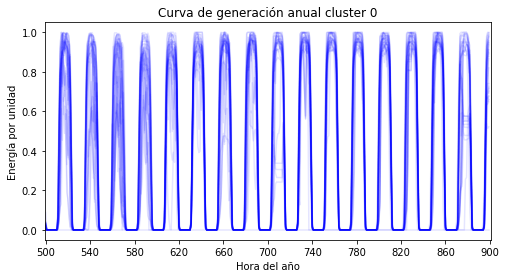

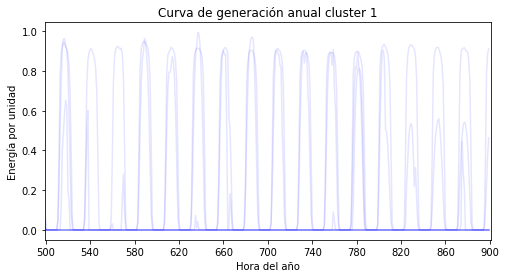

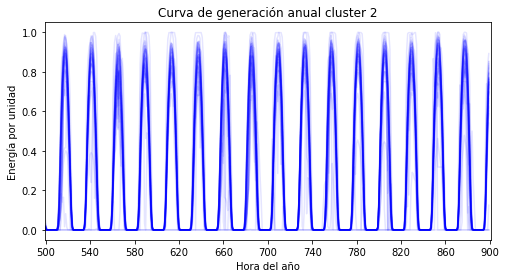

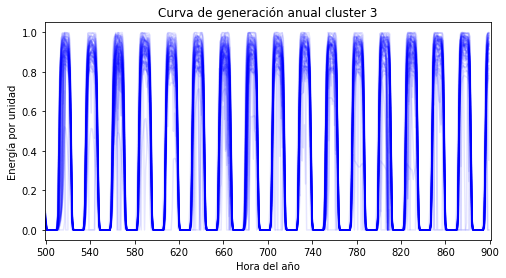

In [363]:
def print_clases(df):
    c = df['clase'].max()
    centrales = []
    for i in range(c+1):
        c0=df.loc[df['clase']==i,:]
        del(c0['clase'])
        centrales.append(c0.index.to_numpy())
        print('Clase {}:'.format(i),len(c0))
    return centrales    

def plot_clases(df,n=400,m=500):
    c = df['clase'].max()+1
    for i in range(c):
        e = (df[df['clase']==i]).drop('clase', axis=1)
        plt.figure(figsize=(8,4))
        plt.plot(range(m,n+m), e.T.values[m:m+n,:], color='blue', alpha=0.1)
        plt.xlabel('Hora del año')
        plt.xticks(np.linspace(m,m+n,11))
        plt.ylabel('Energía por unidad')
        plt.title('Curva de generación anual cluster {}'.format(i))
        plt.xlim((m-1,m+n+1))
        plt.show()


c_solares = print_clases(solar)
plot_clases(solar, 400,500)

## Centrales eólicas

9


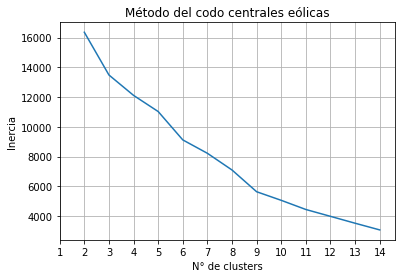

In [320]:
distancia=[]
for n in range(2,15,1):
    model = KMeans(n_clusters=n)
    model.fit(eolica)
    distancia.append(model.inertia_)

kl = KneeLocator(range(2,15),distancia,curve='convex',direction='decreasing')
print(kl.elbow)
plt.plot(range(2,15,1),distancia)
plt.xticks(range(1,15,1))
plt.grid()
plt.title('Método del codo centrales eólicas')
plt.xlabel('N° de clusters')
plt.ylabel('Inercia')
plt.show()

In [321]:
eolica = asignar_clase(eolica,6)
eolica.head()

time,2020-01-01 00:00:00,2020-01-01 01:00:00,2020-01-01 02:00:00,2020-01-01 03:00:00,2020-01-01 04:00:00,2020-01-01 05:00:00,2020-01-01 06:00:00,2020-01-01 07:00:00,2020-01-01 08:00:00,2020-01-01 09:00:00,...,2020-12-31 15:00:00,2020-12-31 16:00:00,2020-12-31 17:00:00,2020-12-31 18:00:00,2020-12-31 19:00:00,2020-12-31 20:00:00,2020-12-31 21:00:00,2020-12-31 22:00:00,2020-12-31 23:00:00,clase
central_nombre,,,,,,,,,,,,,,,,,,,,,
PE AURORA,0.948911,0.868509,0.576214,0.834171,0.628978,0.645729,0.668342,0.494975,0.386935,0.168342,...,0.087102,0.199330,0.237856,0.298995,0.339196,0.369347,0.276382,0.287270,0.455611,5
PE CABO LEONES,0.041156,0.007005,0.000000,0.000000,0.000000,0.104203,0.256567,0.142732,0.081436,0.077058,...,0.280210,0.577058,0.560420,0.451839,0.387040,0.247811,0.135727,0.026270,0.000000,0
PE CANELA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000566,0.003398,0.075311,0.199887,0.371461,0.351076,0.261608,0.051529,0.005663,3
PE CANELA II,0.005071,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.002197,0.007099,0.101082,0.246112,0.608181,0.676978,0.458080,0.243746,0.088066,3
PE CUEL,0.544438,0.583434,0.475816,0.387545,0.347037,0.331923,0.311366,0.241233,0.050484,0.000907,...,0.698609,0.575272,0.637848,0.615175,0.500907,0.710701,0.692563,0.649637,0.694680,1


Clase 0: 3
Clase 1: 10
Clase 2: 2
Clase 3: 9
Clase 4: 2
Clase 5: 6


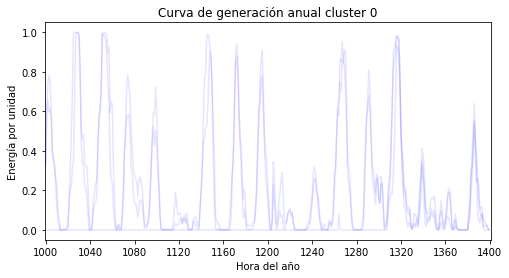

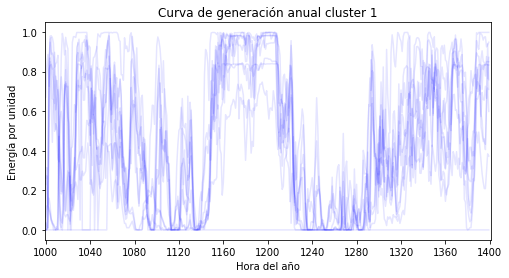

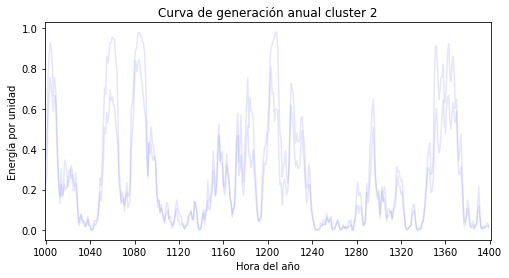

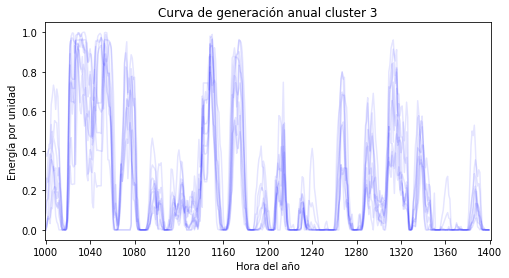

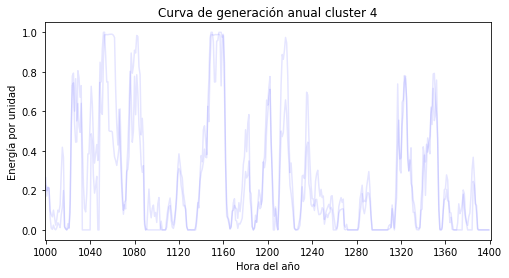

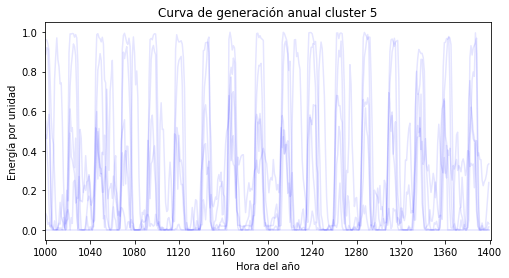

In [322]:
c_eolica = print_clases(eolica)
e0 = eolica[eolica['clase']==0]
e0 = e0.drop('clase', axis=1)

plot_clases(eolica,400,1000)

Se pueden apreciar 3 clusters asociados a energía fotovoltaica, donde en la primera clase (0), todas las unidades corresponden a PMGD, luego la siguiente clase (3) está compuesta por 8 PMGD FV y 22 FV y la clase 4 por 30 PMGD FV y 9 FV. Luego, se tienen 2 clases exclusivamente de energía eólica, clase 1 y 2 en donde la primera está compuesta por 4 PMGD y 6 PE, mientras que la segunda con solo 1 PMGD PE y 18 PE.

Finalmente, está la clase 5 compuesta por 3 PE, 1 FV y 8 PMGD FV, sin embargo, al comparar el gráfico con con los otros su densidad es mucho menor, y las centrales que entran en esta clase, pueden ser outliers debido a, por ejemplo, paradas durante varios días. 

## Geolocación de clusters

In [311]:
df = cargar_dataset()
de = df
solar = df[df['central_tipo']=='Solar'] #Datos de las centrales solares.
eolica = df[df['central_tipo']=='Eólica'] # Datos de las centrales eólicas.

df = pd.concat([solar,eolica])
df = df.sort_values(['time'], ascending=True)
df = df.reset_index()

eol = eolica.pivot_table(values='generacion_real_ernc_mwh', columns='central_nombre', index='time')
sol = solar.pivot_table(values='generacion_real_ernc_mwh', columns='central_nombre', index='time')
de = de.pivot_table(values='generacion_real_mwh', columns='central_nombre', index='time')
eol.head()

central_nombre,PE AURORA,PE CABO LEONES,PE CABO LEONES II,PE CABO LEONES II [En_Revision],PE CABO LEONES III,PE CABO LEONES III [EN_REVISION],PE CABO LEONES III [En_Revision],PE CANELA,PE CANELA II,PE CUEL,...,PE UCUQUER II,PE VALLE DE LOS VIENTOS,PE VIENTOS PATAGONICOS (SM) [EN_REVISION],PMGD PE EL ARREBOL,PMGD PE EL NOGAL,PMGD PE HUAJACHE,PMGD PE LAS PEÑAS,PMGD PE LEBU III,PMGD PE RAKI,PMGD PE UCUQUER
time,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,113.3,4.7,NaN,NaN,NaN,NaN,NaN,0.0,0.3,18.01,...,0.00,6.6493,NaN,NaN,6.428544,5.750661,8.191932,0.895025,7.598362,0.000000
2020-01-01 01:00:00,103.7,0.8,NaN,NaN,NaN,NaN,NaN,0.0,0.0,19.30,...,0.00,0.0502,NaN,NaN,5.556577,4.494656,7.418644,0.478126,5.419370,0.000000
2020-01-01 02:00:00,68.8,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,15.74,...,0.04,0.8958,NaN,NaN,3.007792,3.469866,6.194368,0.454619,4.149369,0.154903
2020-01-01 03:00:00,99.6,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,12.82,...,0.09,0.6307,NaN,NaN,2.299366,2.372455,6.130867,0.299609,3.288258,0.274007
2020-01-01 04:00:00,75.1,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,11.48,...,0.07,0.4157,NaN,NaN,2.615824,2.234700,7.579557,0.335788,2.949745,0.262205


-68.5824728807364


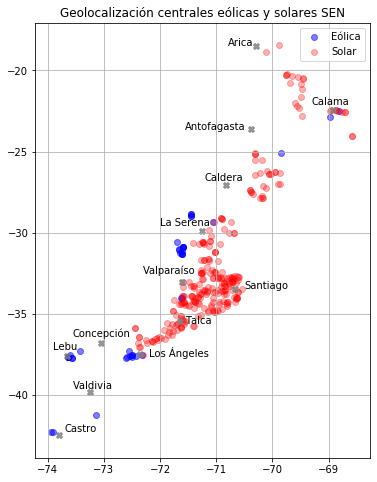

43


In [341]:
link = 'https://raw.githubusercontent.com/MatiasOssest/memoria/master/coordenadas.csv'

coords = pd.read_csv('coordenadas.csv')

coords = coords[coords['Norte']<50000000]
coords = coords[coords['Este']<6000000]
coords = coords[coords['Longitud']>-74]
eo = coords[coords['Tipo Tecnología'] == 'Eólica']
so = coords[coords['Tipo Tecnología'] == 'Fotovoltaica']

ciudades_long = [-70.6653, -73.8,-71.6167, -73.2458, -73.66,-72.36, -71.65, -73.05, -71.25, -70.83, -70.39, -68.92, -70.29]
ciudades_lat = [-33.4513, -42.4667, -33.05, -39.8139, -37.624, -37.47, -35.43, -36.81, -29.9, -27.085, -23.63, -22.45, -18.476]

plt.figure(figsize=(6,8))
plt.scatter(eo['Longitud'],eo['Latitud'], alpha=0.5, c='blue', label='Eólica')
plt.scatter(so['Longitud'], so['Latitud'],  alpha=0.3, c='red', label='Solar')
plt.scatter(ciudades_long, ciudades_lat, c='grey', alpha=0.8, marker='X')

plt.annotate('Santiago',(-70.5,-33.4513))
plt.annotate('Castro', (-73.7,-42.2667))
plt.annotate('Valparaíso', (-72.3,-32.5))
plt.annotate('Valdivia', (-73.5458,-39.6))
plt.annotate('Lebu', (-73.9,-37.2))
plt.annotate('Los Ángeles', (-72.2,-37.67))
plt.annotate('Talca', (-71.55,-35.63))
plt.annotate('Concepción', (-73.55, -36.4))
plt.annotate('La Serena', (-72, -29.6))
plt.annotate('Caldera', (-71.2,-26.8))
plt.annotate('Antofagasta', (-71.55, -23.63))
plt.annotate('Calama', (-69.3, -22.1))
plt.annotate('Arica', (-70.8,-18.47))

plt.title('Geolocalización centrales eólicas y solares SEN')
plt.legend()
print(max(coords['Longitud']))
plt.grid()
plt.savefig('coordenadas.png')
plt.show()
print(len(coords[coords['Tipo Tecnología']== "Eólica"]))
   

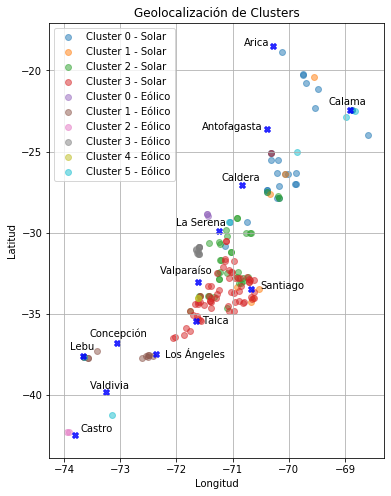

In [365]:
plt.figure(figsize=(6,8))
for i in range(len(c_solares)):
    idx = c_solares[i]
    s = so[so['nombre'].isin(idx)]
    plt.scatter(s['Longitud'], s['Latitud'], alpha=0.5, label='Cluster {} - Solar'.format(i))

for i in range(len(c_eolica)):
    idx = c_eolica[i]
    e = eo[eo['nombre'].isin(idx)]
    plt.scatter(e['Longitud'], e['Latitud'], alpha=0.5, label='Cluster {} - Eólico'.format(i))
 

plt.scatter(ciudades_long, ciudades_lat, c='blue', alpha=0.8, marker='X')

plt.annotate('Santiago',(-70.5,-33.4513))
plt.annotate('Castro', (-73.7,-42.2667))
plt.annotate('Valparaíso', (-72.3,-32.5))
plt.annotate('Valdivia', (-73.5458,-39.6))
plt.annotate('Lebu', (-73.9,-37.2))
plt.annotate('Los Ángeles', (-72.2,-37.67))
plt.annotate('Talca', (-71.55,-35.63))
plt.annotate('Concepción', (-73.55, -36.4))
plt.annotate('La Serena', (-72, -29.6))
plt.annotate('Caldera', (-71.2,-26.8))
plt.annotate('Antofagasta', (-71.55, -23.63))
plt.annotate('Calama', (-69.3, -22.1))
plt.annotate('Arica', (-70.8,-18.47))

plt.ylabel('Latitud')
plt.xlabel('Longitud')
plt.title('Geolocalización de Clusters')
plt.legend()
plt.grid()
plt.show()

In [22]:
def producto_cruz(x1,y1,x2,y2,x,y):
    return ((x2 - x1)*(y-y1)) - (y2 - y1)*(x-x1)

def asignar_region(latitud, longitud):
  
    if latitud > -18:
        return 0
    ## Áreas 1, 2 y 3.
    elif latitud >= -21.46:
        f1 = producto_cruz(-18.33,-70.08,-21.46,-69.94,latitud, longitud)
        f2 = producto_cruz(-18.33, -69.82,-21.46, -69.18, latitud, longitud)
        if longitud < -70.33 or longitud > -68:
            return 0
        elif  f1 > 0  and f2 > 0:
            return 1
        elif f1 < 0 and f2 > 0:
            return 2
        elif f1 < 0 and f2 <= 0:
            return 3
    elif latitud >= -27.10:
        f1 = producto_cruz(-21.46,-69.94,-27.10,-70.63, latitud, longitud)
        f2 = producto_cruz(-21.46,-69.18,27.10,-69.92, latitud, longitud)

        if longitud < -71.2 or longitud > -68:
            return 0 
        elif  f1 > 0  and f2 > 0:
            return 1
        elif f1 < 0 and f2 > 0:
            return 2
        elif f1 < 0 and f2 <= 0:
            return 3
  
    ## Áreas 4, 5 y 6.
    elif latitud > -29.56:
    
        f1 = producto_cruz(-27.10,-70.68,-29.56,-71.22, latitud, longitud)
        f2 = producto_cruz(-27.10, -69.77, -29.56, -70.64, latitud, longitud)

        if longitud < -71.62 or longitud > -68.3:
            return 0
        elif f1 >= 0 and f2 > 0:
            return 4
        elif f1 < 0 and f2 > 0:
            return 5
        elif f1 < 0 and f2 <= 0:
            return 6
   
    elif latitud > -33.06:

        f1 = producto_cruz(-29.56,-71.22,-33.06,-71.49, latitud, longitud)
        f2 = producto_cruz(-29.46, -70.64, -33.06, -70.70, latitud, longitud)
    
        if longitud < -71.8 or longitud > -68.3:
            return 0
        elif  f1 >= 0  and f2 > 0:
            return 4
        elif f1 < 0 and f2 > 0:
            return 5
        elif f1 < 0 and f2 <= 0:
            return 6 
  
    ## Áreas 7, 8 y 9.
    elif latitud > -33.59:
    
        f1 = producto_cruz(-33.06,-71.49,-33.59,-71.49, latitud, longitud)
        f2 = producto_cruz(-33.06, -70.61, -33.59, -70.54, latitud, longitud)

        if longitud < -71.62 or longitud > -69.64:
            return 0
        elif f1 >= 0 and f2 > 0:
            return 7
        elif f1 < 0 and f2 > 0:
            return 8
        elif f1 < 0 and f2 <= 0:
            return 9
   
    elif latitud > -38.70:

        f1 = producto_cruz(-33.59,-71.49, -38.70, -73.4, latitud, longitud)
        f2 = producto_cruz(-33.59, -70.54, -38.7, -72.06, latitud, longitud)
    
        if longitud < -73.77 or longitud > -69.64:
            return 0
        elif  f1 >= 0  and f2 > 0:
            return 7
        elif f1 < 0 and f2 > 0:
            return 8
        elif f1 < 0 and f2 <= 0:
            return 9

    ## Áreas 10, 11 y 12.
    elif latitud > -39.31:
    
        f1 = producto_cruz(-38.7,-73.4,-39.31,-73.12, latitud, longitud)
        f2 = producto_cruz(-38.7, -72, -39.31, -72.15, latitud, longitud)

        if longitud < -73.39 or longitud > -71.10:
            return 0
        elif f1 >= 0 and f2 > 0:
            return 10
        elif f1 < 0 and f2 > 0:
            return 11
        elif f1 < 0 and f2 <= 0:
            return 12
   
    elif latitud > -43.35:

        f1 = producto_cruz(-39.31,-73.12, -43.35, -74.06, latitud, longitud)
        f2 = producto_cruz(-39.31, -72.15, -43.35, -72.88, latitud, longitud)
    
        if longitud < -74.51 or longitud > -71.10:
            return 0
        elif  f1 >= 0  and f2 > 0:
              return 10
        elif f1 < 0 and f2 > 0:
              return 11
        elif f1 < 0 and f2 <= 0:
              return 12
    else:
        return 0

coords['area'] = coords.apply(lambda x: asignar_region(x['Latitud'], x['Longitud']), axis=1)
coords = coords[['nombre', 'Tipo Tecnología', 'Latitud', 'Longitud', 'area']]
coords

,nombre,Tipo Tecnología,Latitud,Longitud,area
0,PE CANELA II,Eólica,-31.313599,-71.601144,4
1,PE MONTE REDONDO,Eólica,-31.077327,-71.657826,4
2,PE TOTORAL,Eólica,-31.325600,-71.611034,4
3,PE PUNTA COLORADA,Eólica,-29.366222,-71.058531,5
4,PE CANELA,Eólica,-31.288341,-71.602340,4
...,...,...,...,...,...
321,PMGD PFV BERRUECO,Fotovoltaica,-36.667459,-72.143369,8
322,PMGD PFV SDSI,Fotovoltaica,-37.537116,-72.306008,8
323,PMGD PFV ORION SOLAR,Fotovoltaica,-36.595123,-72.030672,8
324,PMGD PFV HUAPE,Fotovoltaica,-36.607679,-72.251901,8


In [23]:
coords_eol = coords[coords['Tipo Tecnología'] == 'Eólica']
coords_sol = coords[coords['Tipo Tecnología'] == 'Fotovoltaica']
coords_eol['area'].value_counts()

4     16
8     11
7      9
10     2
2      2
11     1
5      1
3      1
Name: area, dtype: int64

In [24]:
eol =  eol.loc[:, (eol.isna().sum(axis=0) <= 0)]
cols = eol.columns.values
print((eol.max()).sum())
eolica_2020 = coords_eol.loc[coords_eol['nombre'].isin(cols)]
cols_eol =[y for x,y in zip(coords_eol['nombre'].isin(cols),coords_eol['nombre']) if x == True]
eolica_2020['area'].value_counts()

1897.7826804565


4     14
8      8
7      8
10     2
2      2
11     1
5      1
3      1
Name: area, dtype: int64

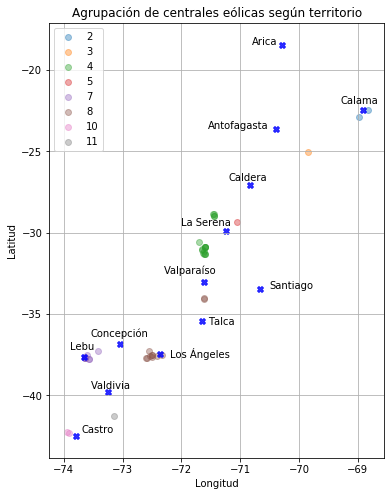

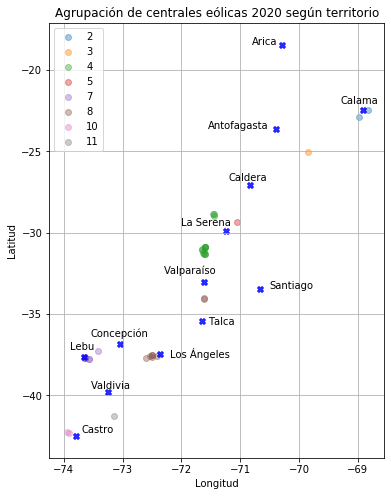

In [339]:
sc = pd.DataFrame(dict(x=coords_eol['Longitud'], y=coords_eol['Latitud'], label=coords_eol['area']))
sc2 =  pd.DataFrame(dict(x=eolica_2020['Longitud'], y=eolica_2020['Latitud'], label=eolica_2020['area']))
groups = sc.groupby('label')
fig, ax = plt.subplots(figsize=(6,8))
for name, group in groups:
    ax.scatter(group.x, group.y, alpha=0.4, label=name)
ax.legend()
plt.title('Agrupación de centrales eólicas según territorio')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid()
plt.scatter(ciudades_long, ciudades_lat, c='blue', alpha=0.8, marker='X')

plt.annotate('Santiago',(-70.5,-33.4513))
plt.annotate('Castro', (-73.7,-42.2667))
plt.annotate('Valparaíso', (-72.3,-32.5))
plt.annotate('Valdivia', (-73.5458,-39.6))
plt.annotate('Lebu', (-73.9,-37.2))
plt.annotate('Los Ángeles', (-72.2,-37.67))
plt.annotate('Talca', (-71.55,-35.63))
plt.annotate('Concepción', (-73.55, -36.4))
plt.annotate('La Serena', (-72, -29.6))
plt.annotate('Caldera', (-71.2,-26.8))
plt.annotate('Antofagasta', (-71.55, -23.63))
plt.annotate('Calama', (-69.3, -22.1))
plt.annotate('Arica', (-70.8,-18.47))
plt.show()

groups = sc2.groupby('label')
fig, ax = plt.subplots(figsize=(6,8))
for name, group in groups:
    ax.scatter(group.x, group.y, alpha=0.4, label=name)
ax.legend()
plt.title('Agrupación de centrales eólicas 2020 según territorio')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.scatter(ciudades_long, ciudades_lat, c='blue', alpha=0.8, marker='X')

plt.annotate('Santiago',(-70.5,-33.4513))
plt.annotate('Castro', (-73.7,-42.2667))
plt.annotate('Valparaíso', (-72.3,-32.5))
plt.annotate('Valdivia', (-73.5458,-39.6))
plt.annotate('Lebu', (-73.9,-37.2))
plt.annotate('Los Ángeles', (-72.2,-37.67))
plt.annotate('Talca', (-71.55,-35.63))
plt.annotate('Concepción', (-73.55, -36.4))
plt.annotate('La Serena', (-72, -29.6))
plt.annotate('Caldera', (-71.2,-26.8))
plt.annotate('Antofagasta', (-71.55, -23.63))
plt.annotate('Calama', (-69.3, -22.1))
plt.annotate('Arica', (-70.8,-18.47))
plt.grid()
plt.show()

In [26]:
coords_sol = coords_sol[coords_sol['area']>0]
coords_sol['area'].value_counts()

8    136
5     77
3     21
2     21
9      7
6      6
7      4
4      2
1      1
Name: area, dtype: int64

In [27]:
sol =  sol.loc[:, (sol.isna().sum(axis=0) <= 0)] # Centrales operando durante todo el 2020
cols = sol.columns.values
print(sol.max().sum())
solar_2020 = coords_sol.loc[coords_sol['nombre'].isin(cols)]
cols_solar =[y for x,y in zip(coords_sol['nombre'].isin(cols),coords_sol['nombre']) if x == True]
solar_2020['area'].value_counts()

2045.9074361324997


5    54
8    51
3    13
2     8
9     5
6     2
4     1
1     1
Name: area, dtype: int64

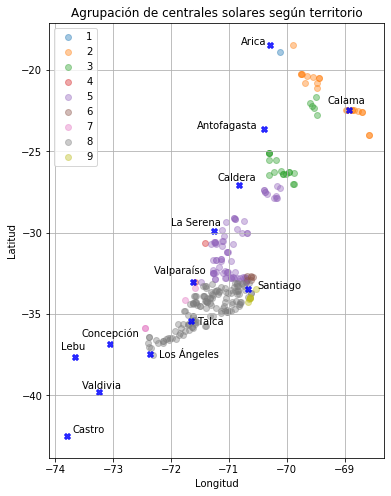

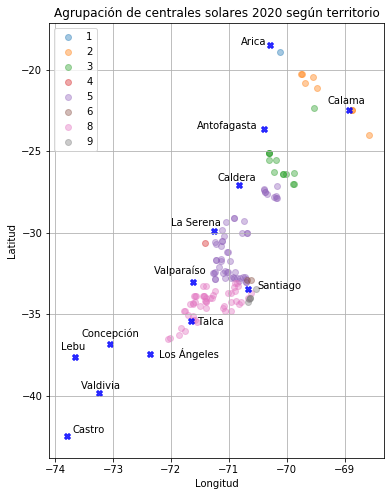

In [338]:
sc = pd.DataFrame(dict(x=coords_sol['Longitud'], y=coords_sol['Latitud'], label=coords_sol['area']))
sc2 = pd.DataFrame(dict(x=solar_2020['Longitud'], y=solar_2020['Latitud'], label=solar_2020['area']))


groups = sc.groupby('label')
fig, ax = plt.subplots(figsize=(6,8))
for name, group in groups:
    ax.scatter(group.x, group.y, alpha=0.4, label=name)
ax.legend()
plt.title('Agrupación de centrales solares según territorio')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid()
plt.scatter(ciudades_long, ciudades_lat, c='blue', alpha=0.8, marker='X')

plt.annotate('Santiago',(-70.5,-33.4513))
plt.annotate('Castro', (-73.7,-42.2667))
plt.annotate('Valparaíso', (-72.3,-32.5))
plt.annotate('Valdivia', (-73.5458,-39.6))
plt.annotate('Lebu', (-73.9,-37.2))
plt.annotate('Los Ángeles', (-72.2,-37.67))
plt.annotate('Talca', (-71.55,-35.63))
plt.annotate('Concepción', (-73.55, -36.4))
plt.annotate('La Serena', (-72, -29.6))
plt.annotate('Caldera', (-71.2,-26.8))
plt.annotate('Antofagasta', (-71.55, -23.63))
plt.annotate('Calama', (-69.3, -22.1))
plt.annotate('Arica', (-70.8,-18.47))
plt.show()

groups = sc2.groupby('label')
fig, ax = plt.subplots(figsize=(6,8))
for name, group in groups:
    ax.scatter(group.x, group.y, alpha=0.4, label=name)
ax.legend()
plt.title('Agrupación de centrales solares 2020 según territorio')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.scatter(ciudades_long, ciudades_lat, c='blue', alpha=0.8, marker='X')

plt.annotate('Santiago',(-70.5,-33.4513))
plt.annotate('Castro', (-73.7,-42.2667))
plt.annotate('Valparaíso', (-72.3,-32.5))
plt.annotate('Valdivia', (-73.5458,-39.6))
plt.annotate('Lebu', (-73.9,-37.2))
plt.annotate('Los Ángeles', (-72.2,-37.67))
plt.annotate('Talca', (-71.55,-35.63))
plt.annotate('Concepción', (-73.55, -36.4))
plt.annotate('La Serena', (-72, -29.6))
plt.annotate('Caldera', (-71.2,-26.8))
plt.annotate('Antofagasta', (-71.55, -23.63))
plt.annotate('Calama', (-69.3, -22.1))
plt.annotate('Arica', (-70.8,-18.47))
plt.grid()
plt.show()

# Mix óptimo

In [369]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

def get_generacion(df, columns):
    col = intersection(df.columns.tolist(), columns)
    return df[col], col

df2, cols_sol = get_generacion(sol,cols_solar)
df2.head()

central_nombre,PFV ANDES SOLAR,PFV ANTAY,PFV CARRERA PINTO,PFV CHAÑARES,PFV CONEJO SOLAR,PFV DIEGO DE ALMAGRO,PFV DOÑA CARMEN SOLAR,PFV EL ROMERO,PFV ESPERANZA,PFV FINIS TERRAE,...,PMGD PFV TECHOS DE ALTAMIRA,PMGD PFV TILTIL,PMGD PFV TRICAHUE II,PMGD PFV VALLE DE LA LUNA II,PMGD PFV VALLE SOLAR ESTE II,PMGD PFV VALLE SOLAR OESTE II,PMGD PFV VILLA PRAT,PMGD PFV VILLA SECA,PMGD PFV VITUCO 2B,PMGD PFV ÑILHUE
time,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 02:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 03:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [370]:
df1, col_eol =get_generacion(eol,cols_eol)
df1.head()

central_nombre,PE AURORA,PE CABO LEONES,PE CANELA,PE CANELA II,PE CUEL,PE LA ESPERANZA,PE LA FLOR,PE LEBU,PE LOS BUENOS AIRES,PE LOS CURUROS,...,PE TALTAL,PE TOTORAL,PE UCUQUER II,PE VALLE DE LOS VIENTOS,PMGD PE EL NOGAL,PMGD PE HUAJACHE,PMGD PE LAS PEÑAS,PMGD PE LEBU III,PMGD PE RAKI,PMGD PE UCUQUER
time,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,113.3,4.7,0.0,0.3,18.01,8.25,26.0,2.5,13.87,0.1,...,16.73,0.0,0.00,6.6493,6.428544,5.750661,8.191932,0.895025,7.598362,0.000000
2020-01-01 01:00:00,103.7,0.8,0.0,0.0,19.30,8.74,26.0,1.8,17.78,0.0,...,32.41,0.0,0.00,0.0502,5.556577,4.494656,7.418644,0.478126,5.419370,0.000000
2020-01-01 02:00:00,68.8,0.0,0.0,0.0,15.74,6.40,20.0,1.4,12.12,0.0,...,19.72,0.0,0.04,0.8958,3.007792,3.469866,6.194368,0.454619,4.149369,0.154903
2020-01-01 03:00:00,99.6,0.0,0.0,0.0,12.82,6.46,22.0,0.5,10.92,0.0,...,18.08,0.0,0.09,0.6307,2.299366,2.372455,6.130867,0.299609,3.288258,0.274007
2020-01-01 04:00:00,75.1,0.0,0.0,0.0,11.48,6.34,20.0,0.6,10.06,0.0,...,11.72,0.0,0.07,0.4157,2.615824,2.234700,7.579557,0.335788,2.949745,0.262205


In [371]:
def agrupar_por_region(df, regiones,cols):
    df = df.transpose()
    r =regiones[regiones['nombre'].isin(cols)].drop_duplicates(subset='nombre')
    r = r.sort_values(by='nombre')
    print(len(cols))
    print(len(r))
    print(len(df.index))
    df['area'] = r['area'].values
    return df

df_eol = agrupar_por_region(df1, coords_eol, cols_eol)
df_sol = agrupar_por_region(df2, coords_sol, cols_solar)

37
32
32
135
134
134


In [372]:
def generacion_por_region(df):
    df1 = df.iloc[:,:8759].transpose()
    new = pd.DataFrame()
    new_norm = pd.DataFrame()
    nombre = 'zona_'
    p_inst = []
    for i in np.arange(1,13,1):
        centrales = df[df['area'] == i].index.tolist()
        m=df1[centrales].max().sum()
        p_inst.append(m)
        n = nombre+str(i)
        new[n] = df1[centrales].sum(axis=1)
        new_norm[n] = new[n]/m
        
    new_norm = new_norm.fillna(0)    
    return new, new_norm, p_inst
        
e, e_n, P_e = generacion_por_region(df_eol)
print(P_e)
e_n.head()

[0.0, 198.8469, 100.3, 1025.57, 13.6, 0.0, 36.0491307983, 309.5266496582, 0.0, 94.49000000000001, 119.4, 0.0]


,zona_1,zona_2,zona_3,zona_4,zona_5,zona_6,zona_7,zona_8,zona_9,zona_10,zona_11,zona_12
time,,,,,,,,,,,,
2020-01-01 00:00:00,0.0,0.033439,0.166800,0.026268,0.015441,0.0,0.691722,0.692084,0.0,0.244470,0.948911,0.0
2020-01-01 01:00:00,0.0,0.002124,0.323131,0.006338,0.000000,0.0,0.544002,0.736178,0.0,0.321727,0.868509,0.0
2020-01-01 02:00:00,0.0,0.037782,0.196610,0.000458,0.000000,0.0,0.434635,0.612202,0.0,0.513282,0.576214,0.0
2020-01-01 03:00:00,0.0,0.040816,0.180259,0.000000,0.044118,0.0,0.349279,0.464527,0.0,0.564081,0.834171,0.0
2020-01-01 04:00:00,0.0,0.093436,0.116849,0.014587,0.000000,0.0,0.380031,0.544341,0.0,0.475183,0.628978,0.0


In [373]:
s, s_n, P_s = generacion_por_region(df_sol)
print(P_s)
s_n.head(10)

[6.104, 162.6965527905, 784.2186025268999, 2.7478872069999998, 538.3933599586001, 6.0050125732, 0.0, 319.3715942998999, 11.985652587999999, 0.0, 0.0, 0.0]


,zona_1,zona_2,zona_3,zona_4,zona_5,zona_6,zona_7,zona_8,zona_9,zona_10,zona_11,zona_12
time,,,,,,,,,,,,
2020-01-01 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
2020-01-01 01:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
2020-01-01 02:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
2020-01-01 03:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
2020-01-01 04:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
2020-01-01 05:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000268,0.000000,0.0,0.0,0.0
2020-01-01 06:00:00,0.000000,0.000049,0.000121,0.000163,0.000155,0.000464,0.0,0.003997,0.002937,0.0,0.0,0.0
2020-01-01 07:00:00,0.004915,0.084813,0.121363,0.026780,0.056568,0.097423,0.0,0.088083,0.137076,0.0,0.0,0.0
2020-01-01 08:00:00,0.018021,0.479013,0.559683,0.037332,0.287332,0.332365,0.0,0.308970,0.549901,0.0,0.0,0.0


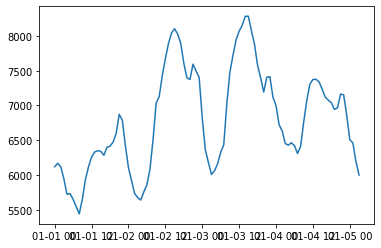

In [374]:
de = de.loc[:, (de.isna().sum(axis=0) <= 0)]
d = de.sum(axis=1)
d
plt.plot(d[0:100])

In [375]:
from scipy.optimize import minimize

def fun_objetivo(x,e_n, s_n, d):
    '''
    x: variable a optimizar
    e_n: generación eólica (parámetro)
    s_n: generación solar (parámetro)
    d: demanda
    '''
    generacion=0
    for i in range(12):
        generacion+= (e_n.iloc[:,i]*x[i] + s_n.iloc[:,i]*x[i+12])
    
    demanda_neta = (d-generacion)
    delta_d_neta = (demanda_neta - demanda_neta.shift(1))
    mse = (delta_d_neta ** 2).mean()
    return np.sqrt((demanda_neta**2).mean())
    #return abs(demanda_neta).mean()
x0 = np.array([P_e,P_s]).flatten()*5

limites=[(0,10000),(0,10000),(0,10000),(0,10000),(0,10000),(0,10000),
        (0,10000),(0,10000),(0,10000),(0,10000),(0,10000),(0,10000),
        (0,10000),(0,10000),(0,10000),(0,10000),(0,10000),(0,10000),
        (0,10000),(0,10000),(0,10000),(0,10000),(0,10000),(0,10000)]

model = minimize(fun_objetivo, x0, args=(e_n,s_n,d), bounds=limites)
print(model)
soluciones = model.x
x = np.arange(1,13,1)
soluciones =soluciones.reshape((2,12))

      fun: 2113.5684759365004
 hess_inv: <24x24 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 0.00000000e+00, -4.54747351e-05,  1.81898940e-04, -2.72848411e-04,
        4.22915036e-03,  0.00000000e+00, -5.91171556e-04, -9.54969437e-04,
        0.00000000e+00, -1.81898940e-04, -2.27373675e-04,  0.00000000e+00,
        1.22327037e-02,  5.45696821e-04, -9.09494702e-05,  3.83806764e-02,
        2.81943358e-03,  1.36424205e-04,  0.00000000e+00,  4.04725142e-03,
        3.77440301e-03,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 1750
      nit: 37
   status: 0
  success: True
        x: array([   0.        , 1844.12479466, 2341.12191932, 3588.85669257,
          0.        ,    0.        ,  806.34413544, 4135.01951603,
          0.        , 3532.31123184,  403.34141135,    0.        ,
          0.        ,  568.85445278, 1768.61701272,    0.        ,
          0.        ,  368.96057644,    0.        

In [376]:
print('Solución:',soluciones)
print('Potencia instalada Eólica [MW]:', soluciones[0,:].sum())
print('Potencia instalada Solar [MW]:', soluciones[1,:].sum())
porcentaje_eolico=100*soluciones[0,:].sum()/soluciones.sum().sum()
porcentaje_solar = 100*soluciones[1,:].sum()/soluciones.sum().sum()
print(f"Mix óptimo: {porcentaje_eolico:.2f} Eólico; {porcentaje_solar:.2f} Solar FV")

Solución: [[   0.         1844.12479466 2341.12191932 3588.85669257    0.
     0.          806.34413544 4135.01951603    0.         3532.31123184
   403.34141135    0.        ]
 [   0.          568.85445278 1768.61701272    0.            0.
   368.96057644    0.            0.            0.            0.
     0.            0.        ]]
Potencia instalada Eólica [MW]: 16651.119701213076
Potencia instalada Solar [MW]: 2706.43204193969
Mix óptimo: 86.02 Eólico; 13.98 Solar FV


1897.7826804565
1831.5226619440998


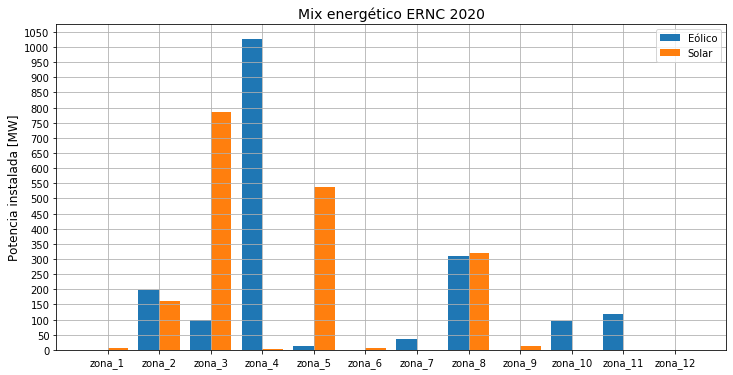

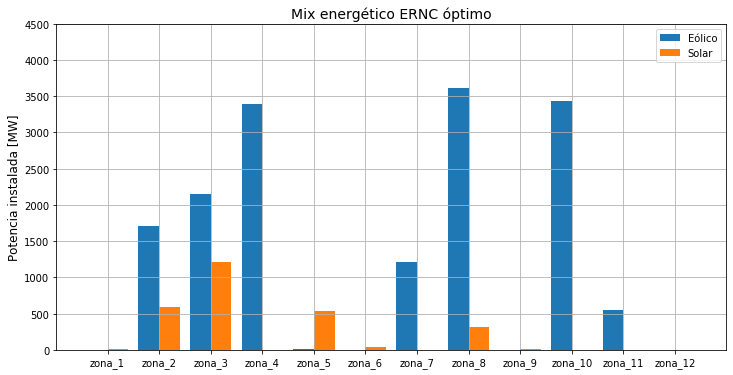

In [411]:
plt.figure(figsize=(12,6))
plt.bar(x-0.2,P_e,width=0.4, label='Eólico')
plt.bar(x+0.2,P_s,width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,1100,50))
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC 2020', fontsize=14)
plt.grid()
plt.show()

plt.figure(figsize=(12,6))
plt.bar(x-0.2,soluciones[0,:],width=0.4, label='Eólico')
plt.bar(x+0.2,soluciones[1,:],width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,4501,500))
plt.grid()
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC óptimo', fontsize=14)
plt.show()

Generación neta: -5808704.2977113165


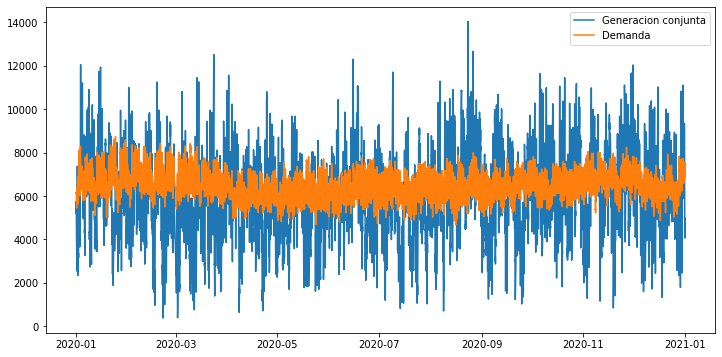

In [378]:
e_total = (e_n * soluciones [0,:]).sum(axis=1)
s_total = (s_n * soluciones[1,:]).sum(axis=1)
g_total = e_total + s_total
m=1000
n=744
generacion_neta = g_total - d 
print('Generación neta:', generacion_neta.sum())
generacion_neta.describe()
plt.figure(figsize=(12,6))
plt.plot(g_total, label='Generacion conjunta')
#plt.plot(s_total[0:n], label='Generación solar')
#plt.plot(e_total[0:n], label='Generación eólica')
plt.plot(d, label='Demanda')
plt.legend()

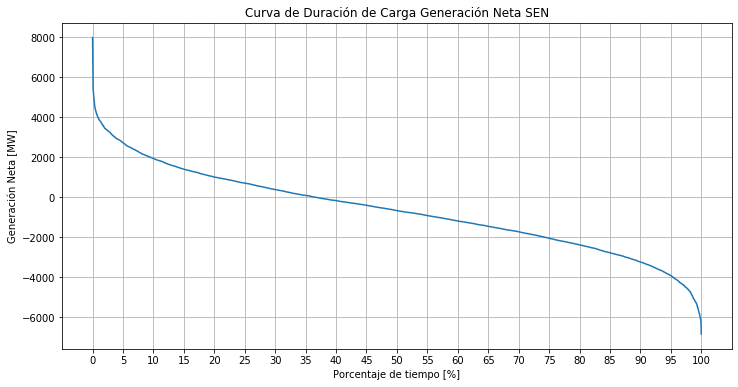

In [379]:
carga = generacion_neta.sort_values(ascending=False).values

plt.figure(figsize=(12,6))
plt.grid()
plt.xlabel('Porcentaje de tiempo [%]')
plt.ylabel('Generación Neta [MW]')
plt.xticks(range(0,101,5))
plt.title('Curva de Duración de Carga Generación Neta SEN')
plt.plot(np.linspace(0,100,len(carga)),carga)
plt.show()

## Mix óptimo con restricción de potencia instalada actual

In [380]:
limites =[]
for p in x0:
    limites.append((p/5,5000))

model = minimize(fun_objetivo, x0, args=(e_n,s_n,d), bounds=limites)
soluciones = model.x
soluciones = soluciones.reshape((2,12))

In [381]:
print('Solución:',soluciones)
print('Potencia instalada Eólica [MW]:', soluciones[0,:].sum())
print('Potencia instalada Solar [MW]:', soluciones[1,:].sum())
porcentaje_eolico=100*soluciones[0,:].sum()/soluciones.sum().sum()
porcentaje_solar = 100*soluciones[1,:].sum()/soluciones.sum().sum()
print(f"Mix óptimo: {porcentaje_eolico:.2f} Eólico; {porcentaje_solar:.2f} Solar FV")

Solución: [[0.00000000e+00 1.83726992e+03 2.34727704e+03 3.57625711e+03
  1.36000000e+01 0.00000000e+00 8.19901304e+02 4.14173287e+03
  0.00000000e+00 3.54040036e+03 4.21989854e+02 0.00000000e+00]
 [6.10400000e+00 3.69949096e+02 1.55938463e+03 2.74788721e+00
  5.38393360e+02 6.00501257e+00 0.00000000e+00 3.19371594e+02
  1.19856526e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Potencia instalada Eólica [MW]: 16698.428458511855
Potencia instalada Solar [MW]: 2813.9412312371865
Mix óptimo: 85.58 Eólico; 14.42 Solar FV


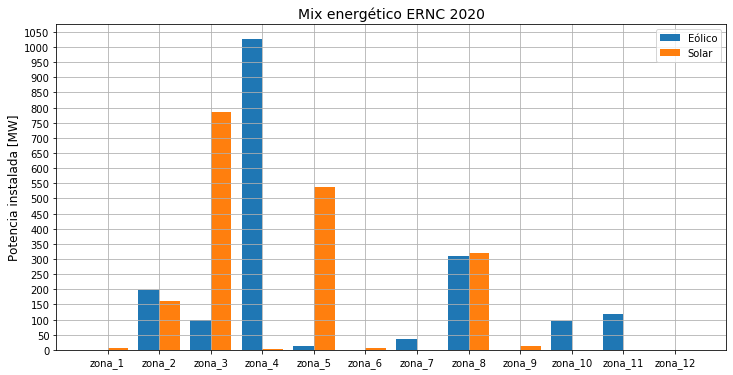

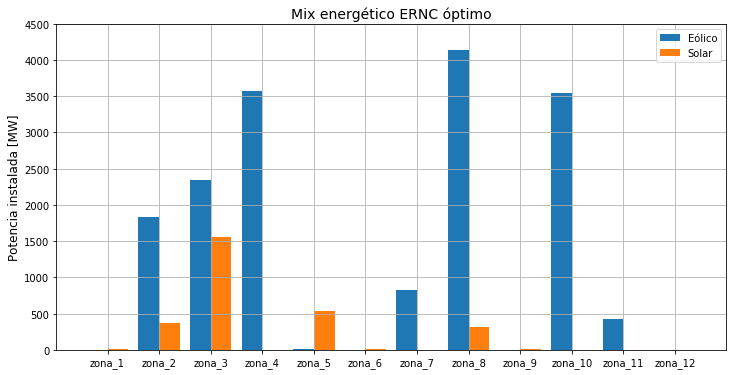

In [382]:
plt.figure(figsize=(12,6))
plt.bar(x-0.2,P_e,width=0.4, label='Eólico')
plt.bar(x+0.2,P_s,width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,1100,50))
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC 2020', fontsize=14)
plt.grid()
plt.show()


plt.figure(figsize=(12,6))
plt.bar(x-0.2,soluciones[0,:],width=0.4, label='Eólico')
plt.bar(x+0.2,soluciones[1,:],width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,4501,500))
plt.grid()
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC óptimo', fontsize=14)
plt.show()

Generación Neta [MWh]:  -5793085.3055659495


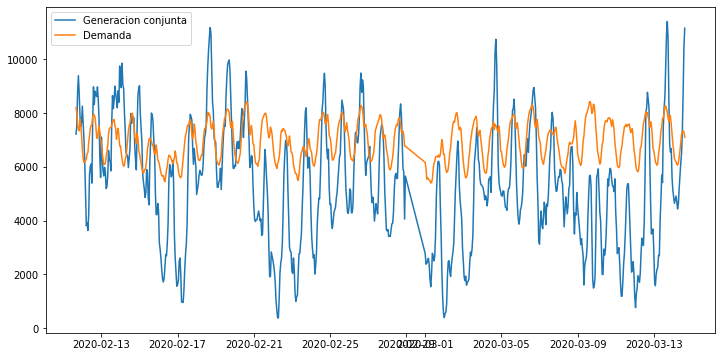

In [383]:
e_total = (e_n * soluciones[0,:]).sum(axis=1)
s_total = (s_n * soluciones[1,:]).sum(axis=1)
g_total = e_total + s_total
m=1000
n=744
generacion_neta = (g_total - d)
print('Generación Neta [MWh]: ',generacion_neta.sum())
plt.figure(figsize=(12,6))
plt.plot(g_total[m:m+n], label='Generacion conjunta')
#plt.plot(s_total[0:n], label='Generación solar')
#plt.plot(e_total[0:n], label='Generación eólica')
plt.plot(d[m:m+n], label='Demanda')
plt.legend()

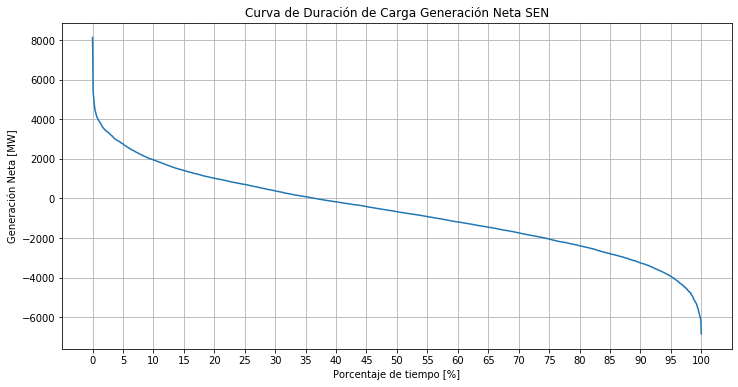

In [384]:
carga = generacion_neta.sort_values(ascending=False).values

plt.figure(figsize=(12,6))
plt.grid()
plt.xlabel('Porcentaje de tiempo [%]')
plt.ylabel('Generación Neta [MW]')
plt.xticks(range(0,101,5))
plt.title('Curva de Duración de Carga Generación Neta SEN')
plt.plot(np.linspace(0,100,len(carga)),carga)
plt.show()

## Optimización con restricción de generación neta

In [385]:
def restriccion(x,e_n,s_n,d, umbral=100000):
    generacion=0 
    for i in range(12):
        generacion+= (e_n.iloc[:,i]*x[i] + s_n.iloc[:,i]*x[i+12])
    return -1*(abs((d-generacion).sum())) + umbral

rest = ({'type':'ineq', 'fun': restriccion, 'args':(e_n,s_n,d,50000000)})

model = minimize(fun_objetivo, x0, args=(e_n,s_n,d), bounds=limites, constraints=rest, method='SLSQP')
print(model)
soluciones = model.x
x = np.arange(1,13,1)
soluciones =soluciones.reshape((2,12))

     fun: 2119.802232074505
     jac: array([ 0.        , -0.00021362, -0.00476074,  0.00152588,  0.00424194,
        0.        ,  0.0039978 , -0.00311279,  0.        ,  0.00332642,
        0.0012207 ,  0.        ,  0.01254272,  0.00021362, -0.00170898,
        0.03945923,  0.00396729, -0.00042725,  0.        ,  0.00540161,
        0.00372314,  0.        ,  0.        ,  0.        ])
 message: 'Optimization terminated successfully.'
    nfev: 2405
     nit: 92
    njev: 92
  status: 0
 success: True
       x: array([2.91855146e-11, 1.84402657e+03, 2.24682053e+03, 3.57441291e+03,
       1.36000000e+01, 2.27522119e-13, 1.23049594e+03, 3.76017201e+03,
       0.00000000e+00, 3.59199692e+03, 5.64476328e+02, 0.00000000e+00,
       6.10400000e+00, 8.89787721e+02, 9.02892718e+02, 2.74788721e+00,
       5.38393360e+02, 1.21400084e+02, 0.00000000e+00, 3.19371594e+02,
       1.19856526e+01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00])


In [386]:
print('Solución:',soluciones)
print('Potencia instalada Eólica [MW]:', soluciones[0,:].sum())
print('Potencia instalada Solar [MW]:', soluciones[1,:].sum())
porcentaje_eolico=100*soluciones[0,:].sum()/soluciones.sum().sum()
porcentaje_solar = 100*soluciones[1,:].sum()/soluciones.sum().sum()
print(f"Mix óptimo: {porcentaje_eolico:.2f} Eólico; {porcentaje_solar:.2f} Solar FV")

Solución: [[2.91855146e-11 1.84402657e+03 2.24682053e+03 3.57441291e+03
  1.36000000e+01 2.27522119e-13 1.23049594e+03 3.76017201e+03
  0.00000000e+00 3.59199692e+03 5.64476328e+02 0.00000000e+00]
 [6.10400000e+00 8.89787721e+02 9.02892718e+02 2.74788721e+00
  5.38393360e+02 1.21400084e+02 0.00000000e+00 3.19371594e+02
  1.19856526e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Potencia instalada Eólica [MW]: 16826.00120758773
Potencia instalada Solar [MW]: 2792.683016607135
Mix óptimo: 85.77 Eólico; 14.23 Solar FV


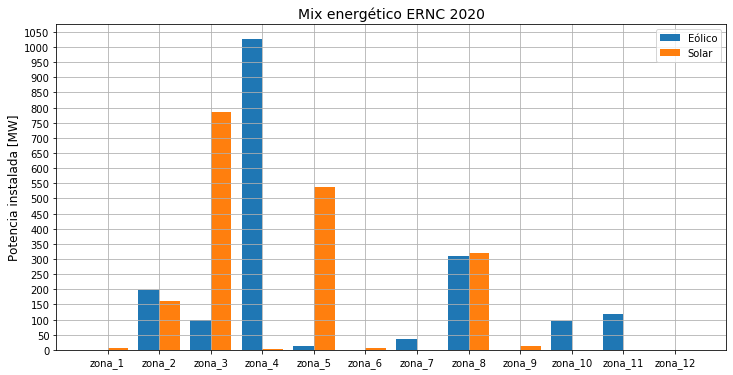

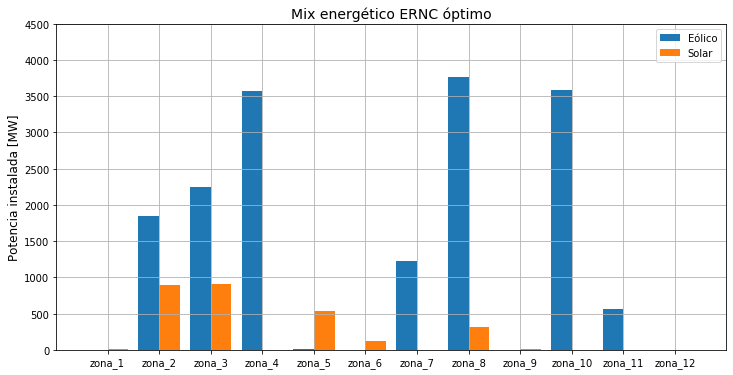

In [387]:
plt.figure(figsize=(12,6))
plt.bar(x-0.2,P_e,width=0.4, label='Eólico')
plt.bar(x+0.2,P_s,width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,1100,50))
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC 2020', fontsize=14)
plt.grid()
plt.show()


plt.figure(figsize=(12,6))
plt.bar(x-0.2,soluciones[0,:],width=0.4, label='Eólico')
plt.bar(x+0.2,soluciones[1,:],width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,4501,500))
plt.grid()
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC óptimo', fontsize=14)
plt.show()

Generación neta: -5822165.576762891


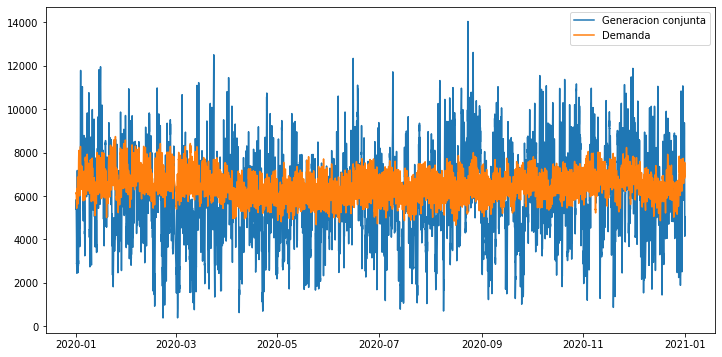

In [388]:
e_total = (e_n * soluciones [0,:]).sum(axis=1)
s_total = (s_n * soluciones[1,:]).sum(axis=1)
g_total = e_total + s_total
m=1000
n=744
generacion_neta = g_total - d 
print('Generación neta:', generacion_neta.sum())
plt.figure(figsize=(12,6))
plt.plot(g_total, label='Generacion conjunta')
#plt.plot(s_total[0:n], label='Generación solar')
#plt.plot(e_total[0:n], label='Generación eólica')
plt.plot(d, label='Demanda')
plt.legend()

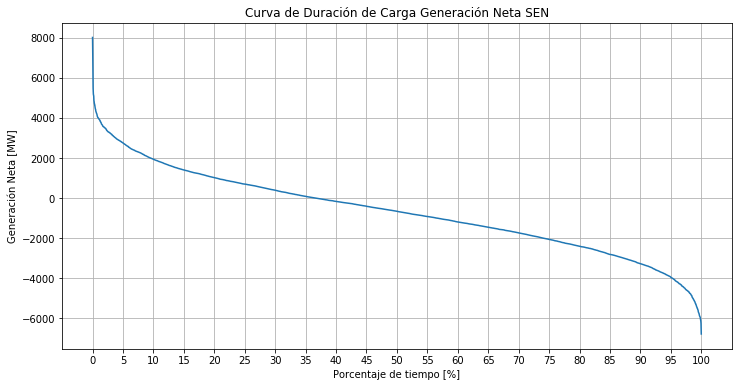

In [389]:
carga = generacion_neta.sort_values(ascending=False).values

plt.figure(figsize=(12,6))
plt.grid()
plt.xlabel('Porcentaje de tiempo [%]')
plt.ylabel('Generación Neta [MW]')
plt.xticks(range(0,101,5))
plt.title('Curva de Duración de Carga Generación Neta SEN')
plt.plot(np.linspace(0,100,len(carga)),carga)
plt.show()

## Mix óptimo con distinta función objetivo

In [404]:
def fun_std(x,e_n, s_n, d):
    '''
    x: variable a optimizar
    e_n: generación eólica (parámetro)
    s_n: generación solar (parámetro)
    d: demanda
    '''
    generacion=0
    for i in range(12):
        generacion+= (e_n.iloc[:,i]*x[i] + s_n.iloc[:,i]*x[i+12])
    
    demanda_neta = d-generacion
    
    return np.std(demanda_neta)

rest = ({'type':'ineq', 'fun': restriccion, 'args':(e_n,s_n,d,8000000)})

model = minimize(fun_std, x0, args=(e_n,s_n,d), bounds=limites, constraints=rest,method='SLSQP')
print(model)
soluciones = model.x
soluciones =soluciones.reshape((2,12))

     fun: 1930.788830306025
     jac: array([0.        , 0.10897827, 0.10247803, 0.09199524, 0.04327393,
       0.        , 0.11593628, 0.10139465, 0.        , 0.09580994,
       0.02371216, 0.        , 0.11450195, 0.10476685, 0.1055603 ,
       0.12590027, 0.09472656, 0.09564209, 0.        , 0.08578491,
       0.08338928, 0.        , 0.        , 0.        ])
 message: 'Optimization terminated successfully.'
    nfev: 2552
     nit: 97
    njev: 97
  status: 0
 success: True
       x: array([7.65858840e-12, 1.70620986e+03, 2.15603611e+03, 3.38986481e+03,
       1.36000000e+01, 1.05822587e-15, 1.20687222e+03, 3.60959186e+03,
       0.00000000e+00, 3.43336996e+03, 5.52441810e+02, 0.00000000e+00,
       6.10400000e+00, 5.93965873e+02, 1.21196438e+03, 2.74788721e+00,
       5.38393360e+02, 3.39601618e+01, 0.00000000e+00, 3.19371594e+02,
       1.19856526e+01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00])


In [405]:
print('Solución:',soluciones)
print('Potencia instalada Eólica [MW]:', soluciones[0,:].sum())
print('Potencia instalada Solar [MW]:', soluciones[1,:].sum())
porcentaje_eolico=100*soluciones[0,:].sum()/soluciones.sum().sum()
porcentaje_solar = 100*soluciones[1,:].sum()/soluciones.sum().sum()
print(f"Mix óptimo: {porcentaje_eolico:.2f} Eólico; {porcentaje_solar:.2f} Solar FV")

Solución: [[7.65858840e-12 1.70620986e+03 2.15603611e+03 3.38986481e+03
  1.36000000e+01 1.05822587e-15 1.20687222e+03 3.60959186e+03
  0.00000000e+00 3.43336996e+03 5.52441810e+02 0.00000000e+00]
 [6.10400000e+00 5.93965873e+02 1.21196438e+03 2.74788721e+00
  5.38393360e+02 3.39601618e+01 0.00000000e+00 3.19371594e+02
  1.19856526e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Potencia instalada Eólica [MW]: 16067.986629290403
Potencia instalada Solar [MW]: 2718.492905408381
Mix óptimo: 85.53 Eólico; 14.47 Solar FV


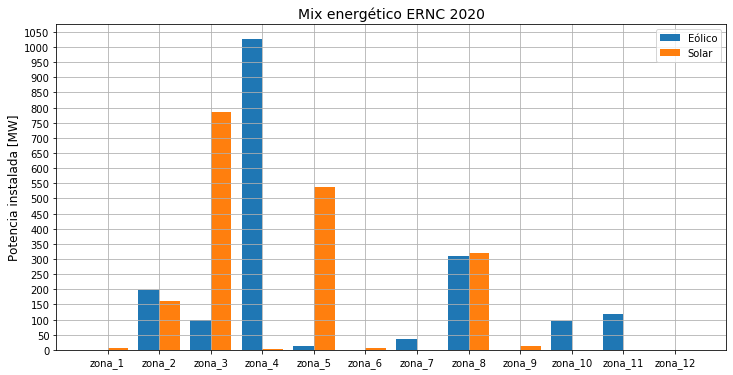

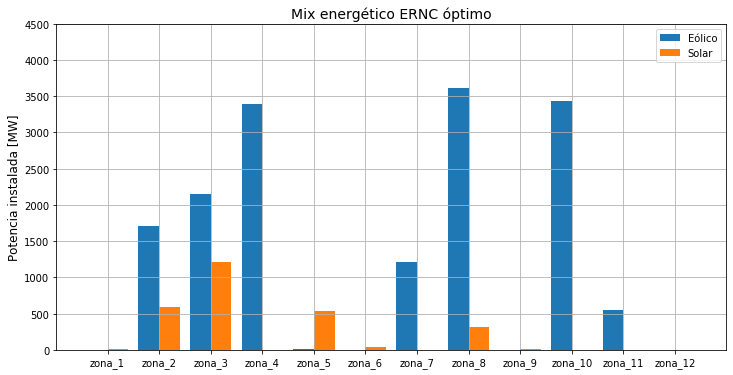

In [406]:
plt.figure(figsize=(12,6))
plt.bar(x-0.2,P_e,width=0.4, label='Eólico')
plt.bar(x+0.2,P_s,width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,1100,50))
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC 2020', fontsize=14)
plt.grid()
plt.show()


plt.figure(figsize=(12,6))
plt.bar(x-0.2,soluciones[0,:],width=0.4, label='Eólico')
plt.bar(x+0.2,soluciones[1,:],width=0.4, label='Solar')
plt.xticks(x,s_n.columns)
plt.yticks(np.arange(0,4501,500))
plt.grid()
plt.legend()
plt.ylabel('Potencia instalada [MW]', fontsize=12)
plt.title('Mix energético ERNC óptimo', fontsize=14)
plt.show()

Generación neta: -7999999.570953547


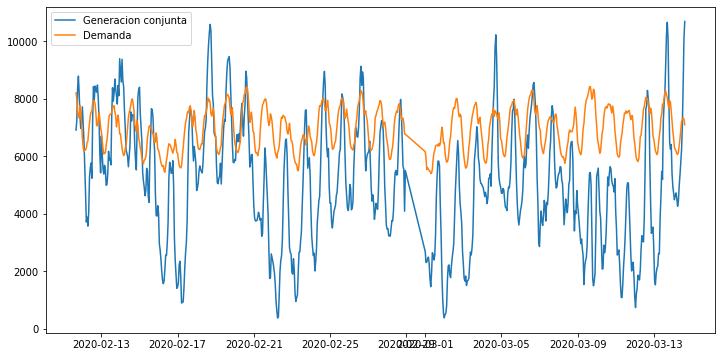

In [407]:
e_total = (e_n * soluciones [0,:]).sum(axis=1)
s_total = (s_n * soluciones[1,:]).sum(axis=1)
g_total = e_total + s_total
m=1000
n=744
generacion_neta = g_total - d 
print('Generación neta:', generacion_neta.sum())
#demanda_neta.describe()
plt.figure(figsize=(12,6))
plt.plot(g_total[m:m+n], label='Generacion conjunta')
#plt.plot(s_total[0:n], label='Generación solar')
#plt.plot(e_total[0:n], label='Generación eólica')
plt.plot(d[m:m+n], label='Demanda')
plt.legend()

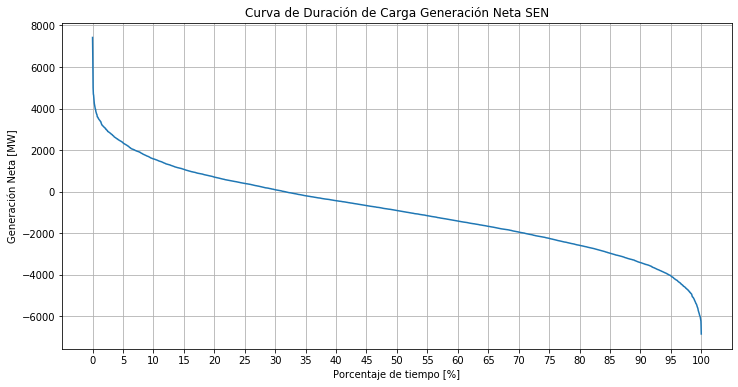

In [408]:
carga = generacion_neta.sort_values(ascending=False).values

plt.figure(figsize=(12,6))
plt.grid()
plt.xlabel('Porcentaje de tiempo [%]')
plt.ylabel('Generación Neta [MW]')
plt.xticks(range(0,101,5))
plt.title('Curva de Duración de Carga Generación Neta SEN')
plt.plot(np.linspace(0,100,len(carga)),carga)
plt.show()

## Curva de duración de carga

In [ ]:
df = cargar_dataset()

solar = df[df['central_tipo']=='Solar'] #Datos de las centrales solares.
eolica = df[df['central_tipo']=='Eólica'] # Datos de las centrales eólicas.

t = df.pivot_table(index='time', values='generacion_real_mwh', aggfunc=np.nansum)
t_ernc = df.pivot_table(index='time', values='generacion_real_ernc_mwh', aggfunc=np.nansum)
solar = solar.pivot_table(index='time', values='generacion_real_ernc_mwh', aggfunc=np.nansum)
eolica = eolica.pivot_table(index='time', values='generacion_real_ernc_mwh', aggfunc=np.nansum)
sol_eo = solar+eolica

t = t.sort_values(by=['generacion_real_mwh'], ascending=False)
t = t['generacion_real_mwh'].reset_index().drop(columns=['time'])
t.columns = ['Duración de carga SEN']
t.head()

In [ ]:
t_ernc = t_ernc.sort_values(by=['generacion_real_ernc_mwh'], ascending=False)
t_ernc = t_ernc['generacion_real_ernc_mwh'].reset_index().drop(columns=['time'])
t_ernc.columns = ['Duración de carga ERNC']
t_ernc.head()

In [ ]:
solar = solar.sort_values(by=['generacion_real_ernc_mwh'], ascending=False)
solar = solar['generacion_real_ernc_mwh'].reset_index().drop(columns=['time'])
solar.columns = ['Duración de carga Solar']
solar.head()

In [ ]:
eolica = eolica.sort_values(by=['generacion_real_ernc_mwh'], ascending=False)
eolica = eolica['generacion_real_ernc_mwh'].reset_index().drop(columns=['time'])
eolica.columns = ['Duración de carga eólica']
eolica.head()

In [ ]:
sol_eo = sol_eo.sort_values(by=['generacion_real_ernc_mwh'], ascending=False)
sol_eo = sol_eo['generacion_real_ernc_mwh'].reset_index().drop(columns=['time'])
sol_eo.columns = ['Duración de carga solar + eólica']
sol_eo.head()

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(t)
plt.plot(t_ernc)
plt.plot(sol_eo)
plt.plot(solar)
plt.plot(eolica)
plt.grid()
plt.xticks(range(0,8761,876))
plt.yticks(range(0,12000,1000))
plt.legend(['SEN', 'ERNC','Solar + Eólica', 'Solar', 'Eólica' ])
plt.title('Curva de duración de carga Sistema Eléctrico Nacional', fontsize=16)
plt.xlabel('Horas', fontsize=14)
plt.ylabel('Potencia [MW]', fontsize=14)
plt.show()

## Variación de generación horaria

In [ ]:
def variacion_horaria(df):
    df1 = df.shift(1)
    df = df1 - df
    df = df.dropna()
    return df

def metodo_codo2(df):
    df = df.transpose()
    verano = df.iloc[:90,:]
    otoño = df.iloc[90:181,:]
    invierno = df.iloc[181:273,:]
    primavera = df.iloc[273:,:]

    l = [verano, otoño, invierno, primavera]
    n =['Verano', 'Otoño', 'Invierno', 'Primavera']
    
    i=-1
    plt.figure(figsize=(12,9))
    plt.suptitle('Descubriendo cantidad de clusters por método del codo')
    for index in range(4):
        i+=1
        distancia=[]
        for n in range(2,15,1):
            model = KMeans(n_clusters=n)
            model.fit(l[i])
            distancia.append(model.inertia_)
        
        kl = KneeLocator(range(2,15),distancia,curve='convex',direction='decreasing')
        print(kl.elbow)   
        plt.subplot(2,2,i+1)
        #plt.title('%s'%n[i])
        plt.plot(range(2,15,1), distancia)
        plt.xticks(range(2,16))
        plt.grid() 
        
def plot_centroides(df, k):
    df = df.transpose()
    verano = df.iloc[0:90,:]
    otoño = df.iloc[90:181,:]
    invierno = df.iloc[181:273,:]
    primavera = df.iloc[273:,:]
    l = [verano, otoño, invierno, primavera]

        
    plt.figure(figsize=(12,9))
    plt.suptitle('Clusters encontrados por estación del año', fontsize=16)
    i=0
    for n in k:        
        model = KMeans(n_clusters=n)
        model.fit(l[i])
        i+=1
        a = model.cluster_centers_
        plt.subplot(2,2,i)
        plt.plot(np.transpose(l[i-1].values), '--', alpha=0.1)
        plt.plot(np.transpose(a))
        plt.xlim([-0.1,23.1])
        plt.xticks(range(0,24,2))
        plt.grid()

In [ ]:
df = cargar_dataset()
t = df.pivot_table(index='time', values='generacion_real_mwh', aggfunc=np.nansum)


s = variacion_horaria(t)
print('máxima variación horaria', s.max(axis=0))
print('variación promedio', s.mean())
print('desvianción estandar', s.std())

In [ ]:
plt.plot(s)

In [ ]:
a = s.to_numpy()
a = np.array([np.nan, a ,np.nan])
a = a.flatten()